## Load modules and data

In [1]:
#Base
import sys, os
import numpy as np
import xarray as xr
import pandas as pd
import json
import tifffile
from glob import glob
#V1DD
from allen_v1dd.client import OPhysClient, OPhysSession

#Date
from datetime import datetime
from uuid import uuid4
from dateutil import tz

#pynwb
from pynwb import NWBHDF5IO, NWBFile, TimeSeries
from pynwb.file import Subject
from pynwb.base import ImageReferences
from pynwb.epoch import TimeIntervals
from pynwb.image import GrayscaleImage, Images, IndexSeries, RGBImage
from pynwb.ophys import (DfOverF, Fluorescence, ImageSegmentation,
                         OpticalChannel, RoiResponseSeries)

#Hdmf & Zarr
from hdmf_zarr.nwb import NWBZarrIO
from hdmf.common import DynamicTable
from hdmf.common import VectorData, VectorIndex
import h5py

%matplotlib inline
%load_ext autoreload
%autoreload 2

PlotDir = '/home/david.wyrick/projects/V1DD/plots'
SaveDir = '/data/v1dd_in_vivo_new_segmentation/real_nwbs'

In [2]:
JuneDir = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/v1dd_physiology/v1dd_physiology/nwb_building'
sys.path.append(JuneDir)
import utils as jun

In [3]:
meta_path = os.path.join(
    JuneDir, 
    'meta_lims', 
    'deepdive_EM_volumes_mouse_ids.json'
    )

with open(meta_path, 'r') as f:
    meta = json.load(f)

mouse_ids = list(meta.keys())
mouse_ids.remove('slc1') # this mouse is excluded

In [5]:
mouse_ids

['slc2', 'teto1', 'slc4', 'slc5']

In [4]:
for _, mID_dict in meta.items():
    print(mID_dict)

{'mouse_id': '393809', 'prod': '25', 'genotype': 'Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94', 'gender': 'male', 'date_of_birth': '20180412'}
{'mouse_id': '409828', 'prod': '55', 'genotype': 'Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94', 'gender': 'male', 'date_of_birth': '20180703'}
{'mouse_id': '416296', 'prod': '55', 'genotype': 'TetO-GCaMP6s;Camk2a-tTA', 'gender': 'female', 'date_of_birth': '20180806'}
{'mouse_id': '438833', 'prod': '55', 'genotype': 'Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94', 'gender': 'male', 'date_of_birth': '20181201'}
{'mouse_id': '427836', 'prod': '55', 'genotype': 'Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94', 'gender': 'female', 'date_of_birth': '20181008'}


In [5]:
base_folder = "/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data"  # Local on robinson for golden mouse
client = OPhysClient(base_folder)

In [6]:
def _configure_stimulus_table(stimulus_df: pd.DataFrame) -> pd.DataFrame:
    """Configure the stimulus table by adding additional columns, sorting existing ones, & changing data-types.
    Args:
        stimulus_df (pd.DataFrame): The stimulus DataFrame to configure.
    Returns:
        pd.DataFrame: Configured stimulus DataFrame.
    """
    stim_cols = ['stim_name','start_time', 'stop_time', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image_order','image_index'] 
    
    if 'image' in stimulus_df.columns:
        # Rename 'image' to 'image_order' if it exists
        stimulus_df.rename(columns={'image': 'image_order'}, inplace=True)
    # Ensure all required columns are present
    for col in stim_cols:
        if col not in stimulus_df.columns:
            stimulus_df[col] = np.nan
    
    # Sort columns
    stimulus_df = stimulus_df[stim_cols]

    # Convert data types
    stimulus_df = stimulus_df.astype({'stim_name':str,'start_time':float, 'stop_time':float, 'temporal_frequency':float, 'spatial_frequency':float, 'direction':float,'frame':float,'image_order':float,'image_index':float})

    return stimulus_df

## Read problematic NWBs

In [10]:
filelist = glob('/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/*.nwb')
filelist

['/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/M438833_52_20190327.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/M427836_25_20190426.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/M438833_33_20190325.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/M438833_34_20190328.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/M427836_45_20190429.nwb']

In [ ]:

io = NWBHDF5IO(filelist[2], "r")
nwb = io.read()
nwb

TypeError: Missing NWB version in file. The file is not a valid NWB file.

In [13]:
fake_nwb = h5py.File(filelist[2], 'r')
dir(fake_nwb)

['_MutableMapping__marker',
 '__abstractmethods__',
 '__bool__',
 '__class__',
 '__class_getitem__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__enter__',
 '__eq__',
 '__exit__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getnewargs__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_d',
 '_e',
 '_gcpl_crt_order',
 '_id',
 '_in_memory_file_counter',
 '_ipython_key_completions_',
 '_lapl',
 '_lcpl',
 '_libver',
 'attrs',
 'build_virtual_dataset',
 'clear',
 'close',
 'copy',
 'create_dataset',
 'create_dataset_like',
 'create_group',
 'create_virtual_dataset',
 'driver',
 'file',
 'filename',
 'flush',
 '

In [ ]:
DataDir = "/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data"  # Local on robinson for golden mouse
microscope_2p_id = 722885523
microscope_3p_id = 762899596
nwb_backend = 'zarr' #iExp
for m_key, mID_dict in meta.items():
    if m_key == 'slc1':
        continue

    mID = mID_dict['mouse_id']
    genotype = mID_dict['genotype']
    gender = mID_dict['gender']
    dob = mID_dict['date_of_birth']
    prod = mID_dict['prod']

    dob_dt = datetime(int(dob[0:4]), int(dob[4:6]), int(dob[6:8]), tzinfo=tz.gettz("US/Pacific"))
    if mID == '409828':
        mouse_desc = 'Golden Mouse'
    else:
        mouse_desc = f'2p Mouse, M{mID}'

    print(f'\nprocessing mouse_id: {mID} ...')


    sesses = jun.get_all_sessions(mID)
    sesses_2p = jun.pick_2p_sessions(sesses)

    for sn, smeta in sesses_2p.items():
        print(f'\tadding session: {sn} ...')
        col = smeta['column']
        vol = smeta['volume']
        lims_path = jun.get_lims_session_path(
            sess=smeta, 
            prod=prod, 
            btv_path="/allen/programs/braintv"
            )
        
        try:
            date = smeta['date']
            fake_nwb_path = os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_{date}.nwb')

        except:
            #Get date from NWB file
            fake_nwb_path = glob(os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_*.nwb'))[0]
            date = fake_nwb_path.split('_')[-1].split('.')[0]
        
        

# Create 2p NWB files

In [7]:
DataDir = "/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data"  # Local on robinson for golden mouse
SaveDir_local = '/data/v1dd_in_vivo_new_segmentation/real_nwbs'
SaveDir_server = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/real_nwbs'

client = OPhysClient(DataDir)
sess = client.load_ophys_session(mouse=409828, column=1, volume=1)
# sess.get_roi_image_mask(1,1)

In [14]:
for m_key, mID_dict in meta.items():
    if m_key == 'slc1':
        continue

    mID = mID_dict['mouse_id']
    genotype = mID_dict['genotype']
    gender = mID_dict['gender']
    dob = mID_dict['date_of_birth']
    prod = mID_dict['prod']

    dob_dt = datetime(int(dob[0:4]), int(dob[4:6]), int(dob[6:8]), tzinfo=tz.gettz("US/Pacific"))
    if mID == '409828':
        mouse_desc = 'Golden Mouse'
    else:
        mouse_desc = f'2p Mouse, M{mID}'
    print(f'\nprocessing mouse_id: {mID} ...')

    sesses = jun.get_all_sessions(mID)
    sesses_2p = jun.pick_2p_sessions(sesses)
    with open(f'mouse_{mID}_sessions.json', mode="w", encoding="utf-8") as write_file:
        json.dump(sesses_2p, write_file,indent=4)


processing mouse_id: 409828 ...

processing mouse_id: 416296 ...

processing mouse_id: 438833 ...

processing mouse_id: 427836 ...


In [7]:
iExp = 0
for m_key, mID_dict in meta.items():
    if m_key == 'slc1':
        continue

    mID = mID_dict['mouse_id']
    genotype = mID_dict['genotype']
    gender = mID_dict['gender']
    dob = mID_dict['date_of_birth']
    prod = mID_dict['prod']

    dob_dt = datetime(int(dob[0:4]), int(dob[4:6]), int(dob[6:8]), tzinfo=tz.gettz("US/Pacific"))
    if mID == '409828':
        mouse_desc = 'Golden Mouse'
    else:
        mouse_desc = f'2p Mouse, M{mID}'
    print(f'\nprocessing mouse_id: {mID} ...')

    sesses = jun.get_all_sessions(mID)
    sesses_2p = jun.pick_2p_sessions(sesses)
    # pdb.set_trace()
    for sn, smeta in sesses_2p.items():
        # sn = '13'; smeta = sesses_2p[sn]
        print(f'\tadding session: {sn} ...')
        iExp += 1


processing mouse_id: 409828 ...
	adding session: 11 ...
	adding session: 12 ...
	adding session: 13 ...
	adding session: 14 ...
	adding session: 15 ...
	adding session: 21 ...
	adding session: 22 ...
	adding session: 23 ...
	adding session: 24 ...
	adding session: 25 ...
	adding session: 31 ...
	adding session: 32 ...
	adding session: 33 ...
	adding session: 34 ...
	adding session: 35 ...
	adding session: 41 ...
	adding session: 42 ...
	adding session: 43 ...
	adding session: 44 ...
	adding session: 45 ...
	adding session: 51 ...
	adding session: 52 ...
	adding session: 53 ...
	adding session: 54 ...
	adding session: 55 ...

processing mouse_id: 416296 ...
	adding session: 11 ...
	adding session: 12 ...
	adding session: 13 ...
	adding session: 14 ...
	adding session: 15 ...
	adding session: 21 ...
	adding session: 22 ...
	adding session: 23 ...
	adding session: 24 ...
	adding session: 25 ...
	adding session: 31 ...
	adding session: 32 ...
	adding session: 33 ...
	adding session: 34 ..

In [10]:
filelist = ['/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M438833_52_20190327.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M427836_25_20190426.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M438833_33_20190325.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M438833_34_20190328.nwb',
 '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M427836_45_20190429.nwb']

In [ ]:
microscope_2p_id = 722885523
microscope_3p_id = 762899596
nwb_backend = 'zarr' #iExp
for m_key, mID_dict in meta.items():
    if m_key == 'slc1':
        continue

    mID = mID_dict['mouse_id']
    genotype = mID_dict['genotype']
    gender = mID_dict['gender']
    dob = mID_dict['date_of_birth']
    prod = mID_dict['prod']

    dob_dt = datetime(int(dob[0:4]), int(dob[4:6]), int(dob[6:8]), tzinfo=tz.gettz("US/Pacific"))
    if mID == '409828':
        mouse_desc = 'Golden Mouse'
    else:
        mouse_desc = f'2p Mouse, M{mID}'

    print(f'\nprocessing mouse_id: {mID} ...')
    # if mID in ['409828','416296','427836']:
    #     continue
    if mID != '409828':
        continue

    sesses = jun.get_all_sessions(mID)
    sesses_2p = jun.pick_2p_sessions(sesses)
    sesses_3p = jun.pick_3p_sessions(sesses)
    # pdb.set_trace()
    for sn, smeta in sesses_2p.items():
        print(f'\tadding session: {sn} ...')
        col = smeta['column']
        vol = smeta['volume']
        lims_path = jun.get_lims_session_path(
            sess=smeta, 
            prod=prod, 
            btv_path="/allen/programs/braintv"
            )
        
        try:
            date = smeta['date']
            fake_nwb_path = os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_{date}.nwb')

        except:
            #Get date from NWB file
            fake_nwb_path = glob(os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_*.nwb'))
            date = fake_nwb_path.split('_')[-1].split('.')[0]

        # if fake_nwb_path not in filelist:
        #     print(f'\t\tSkipping {fake_nwb_path} ...')
        #     continue
        #Get session start time
        #TODOLIST: this is hardcoded to 9am, need to get from LIMS or somewhere
        session_start_time = datetime(int(date[0:4]),int(date[4:6]),int(date[6:8]),9,0,0,tzinfo=tz.gettz("US/Pacific"))
        age_at_session = (session_start_time - dob_dt).days

        # Read in fake NWB file
        # fake_nwb_path = os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_{date}.nwb')
        fake_nwb = h5py.File(fake_nwb_path, 'r')

        # Read in ophys session using V1DD client
        sess = client.load_ophys_session(mouse=mID, column=col, volume=vol)

        # ZARR_fpath = os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb.zarr')
        nwbfile = NWBFile(
            session_description=f"V1 Deep Dive, {mouse_desc}",  
            identifier=str(uuid4()),  
            session_start_time=session_start_time,  # required
            session_id=smeta['session'],  
            institution="Allen Institute",  
            experiment_description=f"2-photon imaging of column {col}, volume {vol}",  
            keywords=["V1", "2p", "visual coding","multi-plane"],
            file_create_date=datetime.now(tz=tz.gettz("US/Pacific")),
        )
        # with NWBZarrIO(path=ZARR_fpath, mode="w") as io:
        #     io.write(nwbfile)

        # with NWBZarrIO(path=ZARR_fpath, mode="r+") as io:
        #     nwb_file = io.read()
        # pdb.set_trace()
        #Create new NWB file

        #Add subject information
        subject = Subject(
                subject_id=mID,
                age=str(age_at_session),
                description=mouse_desc,
                genotype=genotype,
                species="Mus musculus",
                sex=gender,
            )
        nwbfile.subject = subject

        # #Add acquisition timeseries
        # acq_keys = list(fake_nwb['acquisition']['timeseries'].keys())

        # Add images
        acq_keys = list(fake_nwb['acquisition']['images'].keys())
        img_list = [GrayscaleImage(name=key,data=np.array(fake_nwb['acquisition']['images'][key])) for key in acq_keys]

        images = Images(
            name="vasculature_maps",
            images=img_list,
            description="WF & 2p images of vasculature",
        )
        nwbfile.add_acquisition(images)

        ##------------------------------------------
        # Add behavior
        behavior_module = nwbfile.create_processing_module(name="behavior", description="processed behavioral data")

        # Speed
        speed_xr = sess.get_running_speed()
        running_speed = TimeSeries(
            name="running_speed",
            description="Running speed of animal on wheel",
            data=speed_xr.data,
            unit="cm/s",
            timestamps=speed_xr['time'].values,
        )
        behavior_module.add(running_speed)

        #Pupil
        pupil_data = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['data'])
        eye_ts = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['timestamps'])
        cornea_ellipse = pupil_data[:,:5]
        pupil_ellipse = pupil_data[:,10:15]

        col_ts = VectorData(name='timestamps',description='Timestamps for pupil tracking data',data=eye_ts)
        col1 = VectorData(name='ellipse_long_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 2])
        col2 = VectorData(name='ellipse_short_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 3])
        col3 = VectorData(name='area',description='Pupil area calculated from the ellipse parameters',data=np.pi * pupil_ellipse[:,2] * pupil_ellipse[:,3])

        # Add pupil area as a table
        behavior_module.add(DynamicTable(
            name='pupil',
            description='DLC pupil tracking data',
            columns=[col_ts, col1, col2, col3]
        ))

        col1 = VectorData(name='ellipse_long_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 2])
        col2 = VectorData(name='ellipse_short_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 3])
        col3 = VectorData(name='area',description='Corneal area calculated from the ellipse parameters',data=np.pi * cornea_ellipse[:,2] * cornea_ellipse[:,3])

        # Add corneal area as a table
        behavior_module.add(DynamicTable(
            name='corneal_reflection',
            description='DLC corneal tracking data',
            columns=[col_ts,col1, col2, col3]
        ))

        #
        device = nwbfile.create_device(
            name="DEEPSCOPE",
            description=f"Two-photon microscope used for imaging in V1DD, equipment_id = {microscope_2p_id}",
            manufacturer="Custom")
        optical_channel = OpticalChannel(name="TODO",description="TODO",emission_lambda=940.0)
        
        ##------------------------------------------
        # Epoch table
        tmp_list = []
        for stim_name in sess.stim_list:
            stim_table, stim_meta = sess.get_stimulus_table(stim_name)

            start_times = stim_table['start'].values
            end_times = stim_table['end'].values
            start_diffs = np.diff(start_times)
            indy = np.where(start_diffs > 10)[0]

            if len(indy) == 0:

                tMin = stim_table['start'].min()
                tMax = stim_table['end'].max()
                tmp_list.append((stim_name, tMin, tMax))
            else:
                idx = indy[0]+1
                tMin = start_times[:idx].min()
                tMax = end_times[:idx].max()
                tmp_list.append((stim_name, tMin, tMax))
                

                tMin = start_times[idx:].min()
                tMax = end_times[idx:].max()
                tmp_list.append((stim_name, tMin, tMax))

        epoch_df = pd.DataFrame(tmp_list, columns=['stim_name', 'start_time', 'stop_time'])
        epoch_df['duration'] = epoch_df['stop_time'] - epoch_df['start_time']
        epoch_df = epoch_df.sort_values(by=['start_time'])
        epoch_df = epoch_df.reset_index(drop=True)

        trial_table = TimeIntervals(
            name='epochs',
            description=f"Start and stop times for all stimulus epochs",
            columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in epoch_df.columns.tolist()]
        )
        for iT, row in epoch_df.iterrows():
            trial_table.add_row(stim_name=row['stim_name'],
                start_time=row['start_time'],
                stop_time=row['stop_time'],
                duration=row['duration'])
        nwbfile.add_time_intervals(trial_table)

        ##------------------------------------------
        # Stimulus table
        df_list = []
        for stim_name in sess.stim_list:
            stim_table, stim_meta = sess.get_stimulus_table(stim_name)
            stim_table2 = stim_table.copy()
            stim_table2['start_time'] = stim_table2['start']
            stim_table2['stop_time'] = stim_table2['end']
            stim_table2['stim_name'] = stim_name
            stim_table3 = _configure_stimulus_table(stim_table2)
            df_list.append(stim_table3)
        df = pd.concat(df_list, ignore_index=True)
        df_sort = df.sort_values(by=['start_time'])
        stimulus_df = df_sort.reset_index(drop=True)
        stimulus_df['stimulus_condition_id'] = 0
        stim_cond_dict = stimulus_df.groupby(['stim_name','temporal_frequency','spatial_frequency','direction','frame','image_index'],dropna=False).indices
        for ii, (stim_key, stim_indices) in enumerate(stim_cond_dict.items()):
            stimulus_df.loc[stim_indices,'stimulus_condition_id'] = ii

        stim_cols = ['stim_name','start_time', 'stop_time', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image_order','image_index','stimulus_condition_id'] 
        trial_table = TimeIntervals(
            name='stimulus_table',
            description=f"Trial times & parameters all stimulus",
            columns=[{"name": col, "description": col} for col in stim_cols]
        )
        for iT, row in stimulus_df.iterrows():
            trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
                temporal_frequency=row['temporal_frequency'],spatial_frequency=row['spatial_frequency'],direction=row['direction'],
                frame=row['frame'], image_order=row['image_order'], image_index=row['image_index'],stimulus_condition_id=row['stimulus_condition_id'])
        nwbfile.add_time_intervals(trial_table)
        
        # # write new NWB object to file
        # io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb'), mode="w")
        # io.write(nwbfile)
        # io.close()
        # pdb.set_trace()

        ##------------------------------------------
        # Write stimulus images to NWB file
        # Natural images
        stim_df, stim_meta = sess.get_stimulus_table("natural_images")
        image_dict = {i: desc for i, desc in zip(stim_meta['image_index'], stim_meta['image_description'])}
        tif_path = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/stim_movies/stim_natural_images_long.tif'
        tif_stack = tifffile.imread(tif_path)

        img_list = []
        for image_idx in np.unique(stim_df['image_index'].values):
            max_img = GrayscaleImage(
                name=f'{image_idx}',
                data=tif_stack[image_idx,:,:],
                resolution=1.0,  # Update if available
                description=image_dict[image_idx],
            )
            img_list.append(max_img)
        
        images = Images(
            name="natural_images",
            images=img_list,
            description="118 natural images",
            order_of_images=ImageReferences("order_of_images", img_list),
        )
        nwbfile.add_stimulus(images)

        # idx_series = IndexSeries(
        #     name="natural_images",
        #     data=stim_df['image_index'].values,
        #     indexed_images=images,
        #     unit="N/A",
        #     timestamps=stim_df['start'].values,
        # )
        # # nwbfile.add_stimulus(idx_series)
        # nwbfile.add_acquisition(idx_series)

        # Locally sparse noise
        stim_df, stim_meta = sess.get_stimulus_table("locally_sparse_noise")
        tif_path = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/stim_movies/stim_locally_sparse_nois_16x28_displayed.tif'
        tif_stack = tifffile.imread(tif_path)

        img_list = []
        for frame_num in np.unique(stim_df['frame']):
            max_img = GrayscaleImage(
                name=f'{frame_num}',
                data=tif_stack[frame_num,:,:],
                resolution=1.0,  # Update if available
                description='lsn',
            )
            img_list.append(max_img)
        
        images = Images(
            name="locally_sparse_noise",
            images=img_list,
            description="Locally sparse noise images",
            order_of_images=ImageReferences("order_of_images", img_list),
        )
        nwbfile.add_stimulus(images)

        # idx_series = IndexSeries(
        #     name="locally_sparse_noise",
        #     data=stim_df['frame'].values,
        #     indexed_images=images,
        #     unit="N/A",
        #     timestamps=stim_df['start'].values,
        # )
        # # nwbfile.add_stimulus(idx_series)
        # nwbfile.add_acquisition(idx_series)

        #Natural movie
        stim_df, stim_meta = sess.get_stimulus_table("natural_movie")
        tif_path = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/stim_movies/stim_movie_long.tif'
        tif_stack = tifffile.imread(tif_path)

        img_list = []
        for frame_num in np.unique(stim_df['frame']):
            max_img = GrayscaleImage(
                name=f'{frame_num}',
                data=tif_stack[frame_num,:,:],
                resolution=1.0,  # Update if available
                description='natural_movie_frame',  # Update if available
            )
            img_list.append(max_img)

        images = Images(
            name="natural_movie",
            images=img_list,
            description="Natural movie images",
            order_of_images=ImageReferences("order_of_images", img_list),
        )
        nwbfile.add_stimulus(images)

        # idx_series = IndexSeries(
        #     name="natural_movie",
        #     data=stim_df['frame'].values,
        #     indexed_images=images,
        #     unit="N/A",
        #     timestamps=stim_df['start'].values,
        # )
        # # nwbfile.add_stimulus(idx_series)
        # nwbfile.add_acquisition(idx_series)

        # io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}_fix.nwb'), mode="w")
        # io.write(nwbfile)
        # io.close()

        # pdb.set_trace()

        ##------------------------------------------
        # Add 2p time series data per plane
        # for plane in sess.get_planes():
        for plane in range(6):
            # Extract plane data from fake NWB
            dumb_key = f'rois_and_traces_plane{plane}'

            depth = int(np.array(fake_nwb['processing'][dumb_key]['imaging_depth_micron']))
            exp_desc = str(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['description']))[2:-1]
            img_height = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_height']))
            img_width = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_width']))
            pipeline_roi_names = np.array([str(f)[2:-1] for f in np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['pipeline_roi_names'])])
            ref_image_keys = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'])
            
            depth = sess.get_plane_depth(plane+1)
            # pdb.set_trace()
            # Create imaging plane with appropriate metadata
            ophys_module = nwbfile.create_processing_module(name=f'plane-{plane}', description="Single-plane ophys processing module")
            imaging_plane = nwbfile.create_imaging_plane(
                name=f'plane-{plane}',
                optical_channel=optical_channel,
                imaging_rate=6.0,
                description=f"2-photon imaging plane {plane}, depth {depth} microns",
                device=device,
                excitation_lambda=940.0,
                location=f"{depth} um",
                indicator="gcamp6s",
                grid_spacing=[1.0, 1.0],  # Update if available
                origin_coords=[0.0, 0.0, 0.0],
                origin_coords_unit='um')
            
            # Add raw images to NWB file
            # two_p_series = TwoPhotonSeries(
            #     name="TwoPhotonSeries",
            #     description="Raw 2p data",
            #     data=np.ones((1000, 100, 100)),
            #     imaging_plane=imaging_plane,
            #     rate=1.0,
            #     unit="normalized amplitude",
            # )
            # nwbfile.add_acquisition(two_p_series)

            # Add ROI masks
            roi_ids = sess.get_rois(plane+1)
            img_seg = ImageSegmentation(name='image_segmentation')
            ps = img_seg.create_plane_segmentation(
                name=f"roi_table",
                description=f"output from suite2p for plane-{plane}",
                imaging_plane=imaging_plane,
                columns=[
                VectorData(name="column",description="column"),
                VectorData(name="volume",description="volume"),
                VectorData(name="plane",description="plane"),
                VectorData(name="roi",description="roi"),
                VectorData(name="pika_roi_id",description="pika_roi_id"),
                VectorData(name="pika_roi_confidence",description="pika_roi_confidence"),
                VectorData(name="is_soma",description="Soma predictions")],
            colnames=["column","volume","plane","roi",
                    "pika_roi_id","pika_roi_confidence","is_soma"],
            )

            pika_roi_ids = sess.get_pika_roi_ids(plane+1)
            pika_roi_confidence = sess.get_pika_roi_confidence(plane+1)
            for iR, r in enumerate(sess.get_rois(plane+1)):
                ix, iy = sess.get_roi_xy_pixels(plane+1,r)
                iw = np.ones(ix.shape)
                pixel_mask = np.stack((ix,iy,iw)).T
                # image_mask = np.zeros((512, 512), dtype=np.uint8)
                # image_mask[iy,ix] = 1
                is_soma = pika_roi_confidence[iR] > 0.5
                ps.add_roi(pixel_mask=pixel_mask,id=r,column=col,volume=vol,plane=plane,roi=r,pika_roi_id=pika_roi_ids[iR],
                        pika_roi_confidence=pika_roi_confidence[iR],is_soma=is_soma)

            ophys_module.add(img_seg)
            
            # pdb.set_trace()
            # Add projections and images
            img_list = []
            for key in ref_image_keys:
                ref_image = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'][key]['data'])
                max_img = GrayscaleImage(
                    name=f'{key}_plane-{plane}',
                    data=ref_image,
                    resolution=1.0,  # Update if available
                    description=key,
                )
                img_list.append(max_img)

            images = Images(
                name=f"images",
                images=img_list,
                description="Summary images of the ophys movie",
            )
            ophys_module.add(images)

            # Add fluorescence traces
            roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
            trace_xr = sess.get_traces(plane+1,'raw')
            raw_traces = RoiResponseSeries(
                name="raw",
                data=trace_xr.data.T,
                rois=roi_names,
                unit="a.u.",
                timestamps=trace_xr.time.values
            )
            ophys_module.add(raw_traces)

            # add neuropil traces
            # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
            neuropil_xr = sess.get_traces(plane+1,'neuropil')
            neuropil_traces = RoiResponseSeries(
                name="neuropil_fluorescence",
                data=neuropil_xr.data.T,
                rois=roi_names,
                unit="a.u.",
                timestamps=neuropil_xr.time.values
            )
            ophys_module.add(neuropil_traces)

            # add neuropixl corrected traces
            # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
            neuropil_xr = sess.get_traces(plane+1,'subtracted',valid_only=False)
            neuropil_sub_traces = RoiResponseSeries(
                name="neuropil_corrected",
                data=neuropil_xr.data.T,
                rois=roi_names,
                unit="a.u.",
                timestamps=neuropil_xr.time.values
            )
            ophys_module.add(neuropil_sub_traces)

            # add demixed traces
            # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
            demixed_xr = sess.get_traces(plane+1,'demixed',valid_only=False)
            demixed_traces = RoiResponseSeries(
                name="demixed",
                data=demixed_xr.data.T,
                rois=roi_names,
                unit="a.u.",
                timestamps=demixed_xr.time.values
            )
            ophys_module.add(demixed_traces)
            # ophys_module.add(Fluorescence(roi_response_series=[raw_traces,neuropil_traces,neuropil_sub_traces,demixed_traces]))

            # add dff traces
            dff_xr = sess.get_traces(plane+1,'dff',valid_only=False,)
            # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
            dfof_traces_series = RoiResponseSeries(
                name="dff",
                data=dff_xr.data.T,
                rois=roi_names,
                unit="%",
                timestamps=dff_xr.time.values
            )
            ophys_module.add(dfof_traces_series)
            # ophys_module.add(DfOverF(roi_response_series=dfof_traces_series))

            # add event traces
            event_xr = sess.get_traces(plane+1,'events',valid_only=False)
            # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
            event_traces_series = RoiResponseSeries(
                name="events",
                data=event_xr.data.T,
                rois=roi_names,
                unit="a.u.",
                timestamps=dff_xr.time.values
            )

            ophys_module.add(event_traces_series)

            # ophys_module.add(dfof_traces_series))
            # pdb.set_trace()

        # write new NWB object to file
        if nwb_backend == 'hdf5':
            io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb'), mode="w")
            io.write(nwbfile)
            io.close()
        elif nwb_backend == 'zarr':
            io = NWBZarrIO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb.zarr'), mode="w")
            io.write(nwbfile)
            io.close()

        pdb.set_trace()

        
        # plane_depth = smeta['depth']


processing mouse_id: 409828 ...

processing mouse_id: 416296 ...

processing mouse_id: 438833 ...
	adding session: 16 ...


/tmp/ipykernel_1895573/399788277.py:260: FutureWarning: ImageReferences.__init__: Using positional arguments for this method is discouraged and will be deprecated in a future major release. Please use keyword arguments to ensure future compatibility.
  order_of_images=ImageReferences("order_of_images", img_list),
/tmp/ipykernel_1895573/399788277.py:293: FutureWarning: ImageReferences.__init__: Using positional arguments for this method is discouraged and will be deprecated in a future major release. Please use keyword arguments to ensure future compatibility.
  order_of_images=ImageReferences("order_of_images", img_list),
/tmp/ipykernel_1895573/399788277.py:326: FutureWarning: ImageReferences.__init__: Using positional arguments for this method is discouraged and will be deprecated in a future major release. Please use keyword arguments to ensure future compatibility.
  order_of_images=ImageReferences("order_of_images", img_list),


KeyError: "Unable to synchronously open object (object 'rois_and_traces_plane1' doesn't exist)"

In [42]:
import warnings
# FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

In [16]:
microscope_2p_id = 722885523
microscope_3p_id = 762899596
nwb_backend = 'zarr' #iExp
for m_key, mID_dict in meta.items():
    if m_key == 'slc1':
        continue

    mID = mID_dict['mouse_id']
    genotype = mID_dict['genotype']
    gender = mID_dict['gender']
    dob = mID_dict['date_of_birth']
    prod = mID_dict['prod']

    dob_dt = datetime(int(dob[0:4]), int(dob[4:6]), int(dob[6:8]), tzinfo=tz.gettz("US/Pacific"))
    if mID == '409828':
        mouse_desc = 'Golden Mouse'
    else:
        mouse_desc = f'2p Mouse, M{mID}'

    print(f'\nprocessing mouse_id: {mID} ...')
    # if mID in ['409828','416296']:
    #     continue

    if mID != '409828':
        continue
    sesses = jun.get_all_sessions(mID)
    sesses_2p = jun.pick_2p_sessions(sesses)
    sesses_3p = jun.pick_3p_sessions(sesses)
    # pdb.set_trace()
    for sn, smeta in sesses_3p.items():
        print(f'\tadding session: {sn} ...')
        col = smeta['column']
        vol = smeta['volume']
        lims_path = jun.get_lims_session_path(
            sess=smeta, 
            prod=prod, 
            btv_path="/allen/programs/braintv"
            )
        
        if int(vol) >= 10:
            vol = sn[1]
        try:
            date = smeta['date']
            fake_nwb_path = os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_{date}.nwb')

        except:
            #Get date from NWB file
            fake_nwb_path = glob(os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_*.nwb'))[0]
            date = fake_nwb_path.split('_')[-1].split('.')[0]

        #Ensure file has not been created yet
        fpath = os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb')
        fpath = fpath + '.zarr' if nwb_backend == 'zarr' else fpath
        if os.path.exists(fpath):
            print(f'\t\tfile already exists: {fpath}')
            continue
    
        #Get session start time
        #TODOLIST: this is hardcoded to 9am, need to get from LIMS or somewhere
        session_start_time = datetime(int(date[0:4]),int(date[4:6]),int(date[6:8]),9,0,0,tzinfo=tz.gettz("US/Pacific"))
        age_at_session = (session_start_time - dob_dt).days

        # Read in fake NWB file
        # fake_nwb_path = os.path.join(DataDir,'nwbs','processed',f'M{mID}_{col}{vol}_{date}.nwb')
        fake_nwb = h5py.File(fake_nwb_path, 'r')

        # Read in ophys session using V1DD client
        sess = client.load_ophys_session(mouse=mID, column=col, volume=vol)
        # pdb.set_trace()

        # ZARR_fpath = os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb.zarr')
        nwbfile = NWBFile(
            session_description=f"V1 Deep Dive, {mouse_desc}",  
            identifier=str(uuid4()),  
            session_start_time=session_start_time,  # required
            session_id=smeta['session'],  
            institution="Allen Institute",  
            experiment_description=f"3-photon imaging of column {col}, volume {vol}",  
            keywords=["V1", "3p", "visual coding","multi-plane"],
            file_create_date=datetime.now(tz=tz.gettz("US/Pacific")),
        )
        # with NWBZarrIO(path=ZARR_fpath, mode="w") as io:
        #     io.write(nwbfile)

        # with NWBZarrIO(path=ZARR_fpath, mode="r+") as io:
        #     nwb_file = io.read()
        # pdb.set_trace()
        #Create new NWB file

        #Add subject information
        subject = Subject(
                subject_id=mID,
                age=str(age_at_session),
                description=mouse_desc,
                genotype=genotype,
                species="Mus musculus",
                sex=gender,
            )
        nwbfile.subject = subject

        # #Add acquisition timeseries
        # acq_keys = list(fake_nwb['acquisition']['timeseries'].keys())

        # Add images
        acq_keys = list(fake_nwb['acquisition']['images'].keys())
        img_list = [GrayscaleImage(name=key,data=np.array(fake_nwb['acquisition']['images'][key])) for key in acq_keys]

        images = Images(
            name="vasculature_maps",
            images=img_list,
            description="WF & 2p images of vasculature",
        )
        nwbfile.add_acquisition(images)

        ##------------------------------------------
        # Add behavior
        behavior_module = nwbfile.create_processing_module(name="behavior", description="processed behavioral data")

        # Speed
        speed_xr = sess.get_running_speed()
        running_speed = TimeSeries(
            name="running_speed",
            description="Running speed of animal on wheel",
            data=speed_xr.data,
            unit="cm/s",
            timestamps=speed_xr['time'].values,
        )
        behavior_module.add(running_speed)

        #Pupil
        pupil_data = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['data'])
        eye_ts = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['timestamps'])
        cornea_ellipse = pupil_data[:,:5]
        pupil_ellipse = pupil_data[:,10:15]

        col_ts = VectorData(name='timestamps',description='Timestamps for pupil tracking data',data=eye_ts)
        col1 = VectorData(name='ellipse_long_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 2])
        col2 = VectorData(name='ellipse_short_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 3])
        col3 = VectorData(name='area',description='Pupil area calculated from the ellipse parameters',data=np.pi * pupil_ellipse[:,2] * pupil_ellipse[:,3])

        # Add pupil area as a table
        behavior_module.add(DynamicTable(
            name='pupil',
            description='DLC pupil tracking data',
            columns=[col_ts, col1, col2, col3]
        ))

        col1 = VectorData(name='ellipse_long_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 2])
        col2 = VectorData(name='ellipse_short_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 3])
        col3 = VectorData(name='area',description='Corneal area calculated from the ellipse parameters',data=np.pi * cornea_ellipse[:,2] * cornea_ellipse[:,3])

        # Add corneal area as a table
        behavior_module.add(DynamicTable(
            name='corneal_reflection',
            description='DLC corneal tracking data',
            columns=[col_ts,col1, col2, col3]
        ))

        #
        device = nwbfile.create_device(
            name="DEEPSCOPE",
            description=f"Two-photon microscope used for imaging in V1DD, equipment_id = {microscope_2p_id}",
            manufacturer="Custom")
        optical_channel = OpticalChannel(name="TODO",description="TODO",emission_lambda=940.0)
        
        ##------------------------------------------
        # Epoch table
        tmp_list = []
        for stim_name in sess.stim_list:
            stim_table, stim_meta = sess.get_stimulus_table(stim_name)

            start_times = stim_table['start'].values
            end_times = stim_table['end'].values
            start_diffs = np.diff(start_times)
            indy = np.where(start_diffs > 10)[0]

            if len(indy) == 0:

                tMin = stim_table['start'].min()
                tMax = stim_table['end'].max()
                tmp_list.append((stim_name, tMin, tMax))
            else:
                idx = indy[0]+1
                tMin = start_times[:idx].min()
                tMax = end_times[:idx].max()
                tmp_list.append((stim_name, tMin, tMax))
                

                tMin = start_times[idx:].min()
                tMax = end_times[idx:].max()
                tmp_list.append((stim_name, tMin, tMax))

        epoch_df = pd.DataFrame(tmp_list, columns=['stim_name', 'start_time', 'stop_time'])
        epoch_df['duration'] = epoch_df['stop_time'] - epoch_df['start_time']
        epoch_df = epoch_df.sort_values(by=['start_time'])
        epoch_df = epoch_df.reset_index(drop=True)

        trial_table = TimeIntervals(
            name='epochs',
            description=f"Start and stop times for all stimulus epochs",
            columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in epoch_df.columns.tolist()]
        )
        for iT, row in epoch_df.iterrows():
            trial_table.add_row(stim_name=row['stim_name'],
                start_time=row['start_time'],
                stop_time=row['stop_time'],
                duration=row['duration'])
        nwbfile.add_time_intervals(trial_table)

        ##------------------------------------------
        # Stimulus table
        df_list = []
        for stim_name in sess.stim_list:
            stim_table, stim_meta = sess.get_stimulus_table(stim_name)
            stim_table2 = stim_table.copy()
            stim_table2['start_time'] = stim_table2['start']
            stim_table2['stop_time'] = stim_table2['end']
            stim_table2['stim_name'] = stim_name
            stim_table3 = _configure_stimulus_table(stim_table2)
            df_list.append(stim_table3)
        df = pd.concat(df_list, ignore_index=True)
        df_sort = df.sort_values(by=['start_time'])
        stimulus_df = df_sort.reset_index(drop=True)
        stimulus_df['stimulus_condition_id'] = 0
        stim_cond_dict = stimulus_df.groupby(['stim_name','temporal_frequency','spatial_frequency','direction','frame','image_index'],dropna=False).indices
        for ii, (stim_key, stim_indices) in enumerate(stim_cond_dict.items()):
            stimulus_df.loc[stim_indices,'stimulus_condition_id'] = ii

        stim_cols = ['stim_name','start_time', 'stop_time', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image_order','image_index','stimulus_condition_id'] 
        trial_table = TimeIntervals(
            name='stimulus_table',
            description=f"Trial times & parameters all stimulus",
            columns=[{"name": col, "description": col} for col in stim_cols]
        )
        for iT, row in stimulus_df.iterrows():
            trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
                temporal_frequency=row['temporal_frequency'],spatial_frequency=row['spatial_frequency'],direction=row['direction'],
                frame=row['frame'], image_order=row['image_order'], image_index=row['image_index'],stimulus_condition_id=row['stimulus_condition_id'])
        nwbfile.add_time_intervals(trial_table)
        
        # # write new NWB object to file
        # io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb'), mode="w")
        # io.write(nwbfile)
        # io.close()
        # pdb.set_trace()

        ##------------------------------------------
        # Write stimulus images to NWB file
        # Natural images
        stim_df, stim_meta = sess.get_stimulus_table("natural_images")
        image_dict = {i: desc for i, desc in zip(stim_meta['image_index'], stim_meta['image_description'])}
        tif_path = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/stim_movies/stim_natural_images_long.tif'
        tif_stack = tifffile.imread(tif_path)

        img_list = []
        for image_idx in np.unique(stim_df['image_index'].values):
            max_img = GrayscaleImage(
                name=f'{image_idx}',
                data=tif_stack[image_idx,:,:],
                resolution=1.0,  # Update if available
                description=image_dict[image_idx],
            )
            img_list.append(max_img)
        
        images = Images(
            name="natural_images",
            images=img_list,
            description="118 natural images",
            order_of_images=ImageReferences("order_of_images", img_list),
        )
        nwbfile.add_stimulus(images)

        # idx_series = IndexSeries(
        #     name="natural_images",
        #     data=stim_df['image_index'].values,
        #     indexed_images=images,
        #     unit="N/A",
        #     timestamps=stim_df['start'].values,
        # )
        # # nwbfile.add_stimulus(idx_series)
        # nwbfile.add_acquisition(idx_series)

        # Locally sparse noise
        stim_df, stim_meta = sess.get_stimulus_table("locally_sparse_noise")
        tif_path = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/stim_movies/stim_locally_sparse_nois_16x28_displayed.tif'
        tif_stack = tifffile.imread(tif_path)

        img_list = []
        for frame_num in np.unique(stim_df['frame']):
            max_img = GrayscaleImage(
                name=f'{frame_num}',
                data=tif_stack[frame_num,:,:],
                resolution=1.0,  # Update if available
                description='lsn',
            )
            img_list.append(max_img)
        
        images = Images(
            name="locally_sparse_noise",
            images=img_list,
            description="Locally sparse noise images",
            order_of_images=ImageReferences("order_of_images", img_list),
        )
        nwbfile.add_stimulus(images)

        # idx_series = IndexSeries(
        #     name="locally_sparse_noise",
        #     data=stim_df['frame'].values,
        #     indexed_images=images,
        #     unit="N/A",
        #     timestamps=stim_df['start'].values,
        # )
        # # nwbfile.add_stimulus(idx_series)
        # nwbfile.add_acquisition(idx_series)

        #Natural movie
        stim_df, stim_meta = sess.get_stimulus_table("natural_movie")
        tif_path = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/stim_movies/stim_movie_long.tif'
        tif_stack = tifffile.imread(tif_path)

        img_list = []
        for frame_num in np.unique(stim_df['frame']):
            max_img = GrayscaleImage(
                name=f'{frame_num}',
                data=tif_stack[frame_num,:,:],
                resolution=1.0,  # Update if available
                description='natural_movie_frame',  # Update if available
            )
            img_list.append(max_img)

        images = Images(
            name="natural_movie",
            images=img_list,
            description="Natural movie images",
            order_of_images=ImageReferences("order_of_images", img_list),
        )
        nwbfile.add_stimulus(images)

        # idx_series = IndexSeries(
        #     name="natural_movie",
        #     data=stim_df['frame'].values,
        #     indexed_images=images,
        #     unit="N/A",
        #     timestamps=stim_df['start'].values,
        # )
        # # nwbfile.add_stimulus(idx_series)
        # nwbfile.add_acquisition(idx_series)

        # io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}_fix.nwb'), mode="w")
        # io.write(nwbfile)
        # io.close()

        # pdb.set_trace()

        ##------------------------------------------
        # Add 2p time series data per plane
        # for plane in sess.get_planes():
        # for plane in range(6):
        plane = 0
        # Extract plane data from fake NWB
        dumb_key = f'rois_and_traces_plane{plane}'

        depth = int(np.array(fake_nwb['processing'][dumb_key]['imaging_depth_micron']))
        exp_desc = str(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['description']))[2:-1]
        img_height = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_height']))
        img_width = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_width']))
        pipeline_roi_names = np.array([str(f)[2:-1] for f in np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['pipeline_roi_names'])])
        ref_image_keys = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'])
        
        depth = sess.get_plane_depth(plane+1)
        # pdb.set_trace()
        # Create imaging plane with appropriate metadata
        ophys_module = nwbfile.create_processing_module(name=f'plane-{plane}', description="Single-plane ophys processing module")
        imaging_plane = nwbfile.create_imaging_plane(
            name=f'plane-{plane}',
            optical_channel=optical_channel,
            imaging_rate=6.6,
            description=f"3-photon imaging plane {plane}, depth {depth} microns",
            device=device,
            excitation_lambda=1300.0,
            location=f"{depth} um",
            indicator="gcamp6s",
            grid_spacing=[1.0, 1.0],  # Update if available
            origin_coords=[0.0, 0.0, 0.0],
            origin_coords_unit='um')
        
        # Add raw images to NWB file
        # two_p_series = TwoPhotonSeries(
        #     name="TwoPhotonSeries",
        #     description="Raw 2p data",
        #     data=np.ones((1000, 100, 100)),
        #     imaging_plane=imaging_plane,
        #     rate=1.0,
        #     unit="normalized amplitude",
        # )
        # nwbfile.add_acquisition(two_p_series)

        # Add ROI masks
        roi_ids = sess.get_rois(plane+1)
        img_seg = ImageSegmentation(name='image_segmentation')
        ps = img_seg.create_plane_segmentation(
            name=f"roi_table",
            description=f"output from suite2p for plane-{plane}",
            imaging_plane=imaging_plane,
            columns=[
            VectorData(name="column",description="column"),
            VectorData(name="volume",description="volume"),
            VectorData(name="plane",description="plane"),
            VectorData(name="roi",description="roi"),
            VectorData(name="pika_roi_id",description="pika_roi_id"),
            VectorData(name="pika_roi_confidence",description="pika_roi_confidence"),
            VectorData(name="is_soma",description="Soma predictions")],
        colnames=["column","volume","plane","roi",
                "pika_roi_id","pika_roi_confidence","is_soma"],
        )

        pika_roi_ids = sess.get_pika_roi_ids(plane+1)
        pika_roi_confidence = sess.get_pika_roi_confidence(plane+1)
        for iR, r in enumerate(sess.get_rois(plane+1)):
            ix, iy = sess.get_roi_xy_pixels(plane+1,r)
            iw = np.ones(ix.shape)
            pixel_mask = np.stack((ix,iy,iw)).T
            image_mask = np.zeros((512, 512), dtype=np.uint8)
            image_mask[iy,ix] = 1
            is_soma = pika_roi_confidence[iR] > 0.5
            ps.add_roi(image_mask=image_mask,id=r,column=col,volume=vol,plane=plane,roi=r,pika_roi_id=pika_roi_ids[iR],
                    pika_roi_confidence=pika_roi_confidence[iR],is_soma=is_soma)

        ophys_module.add(img_seg)
        
        # pdb.set_trace()
        # Add projections and images
        img_list = []
        for key in ref_image_keys:
            ref_image = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'][key]['data'])
            max_img = GrayscaleImage(
                name=f'{key}_plane-{plane}',
                data=ref_image,
                resolution=1.0,  # Update if available
                description=key,
            )
            img_list.append(max_img)

        images = Images(
            name=f"images",
            images=img_list,
            description="Summary images of the ophys movie",
        )
        ophys_module.add(images)

        # Add fluorescence traces
        roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
        trace_xr = sess.get_traces(plane+1,'raw')
        raw_traces = RoiResponseSeries(
            name="raw",
            data=trace_xr.data.T,
            rois=roi_names,
            unit="a.u.",
            timestamps=trace_xr.time.values
        )
        ophys_module.add(raw_traces)

        # add neuropil traces
        # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
        neuropil_xr = sess.get_traces(plane+1,'neuropil')
        neuropil_traces = RoiResponseSeries(
            name="neuropil_fluorescence",
            data=neuropil_xr.data.T,
            rois=roi_names,
            unit="a.u.",
            timestamps=neuropil_xr.time.values
        )
        ophys_module.add(neuropil_traces)

        # add neuropixl corrected traces
        # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
        neuropil_xr = sess.get_traces(plane+1,'subtracted',valid_only=False)
        neuropil_sub_traces = RoiResponseSeries(
            name="neuropil_corrected",
            data=neuropil_xr.data.T,
            rois=roi_names,
            unit="a.u.",
            timestamps=neuropil_xr.time.values
        )
        ophys_module.add(neuropil_sub_traces)

        # add demixed traces
        # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
        demixed_xr = sess.get_traces(plane+1,'demixed',valid_only=False)
        demixed_traces = RoiResponseSeries(
            name="demixed",
            data=demixed_xr.data.T,
            rois=roi_names,
            unit="a.u.",
            timestamps=demixed_xr.time.values
        )
        ophys_module.add(demixed_traces)
        # ophys_module.add(Fluorescence(roi_response_series=[raw_traces,neuropil_traces,neuropil_sub_traces,demixed_traces]))

        # add dff traces
        dff_xr = sess.get_traces(plane+1,'dff',valid_only=False,)
        # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
        dfof_traces_series = RoiResponseSeries(
            name="dff",
            data=dff_xr.data.T,
            rois=roi_names,
            unit="%",
            timestamps=dff_xr.time.values
        )
        ophys_module.add(dfof_traces_series)
        # ophys_module.add(DfOverF(roi_response_series=dfof_traces_series))

        # add event traces
        event_xr = sess.get_traces(plane+1,'events',valid_only=False)
        # roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
        event_traces_series = RoiResponseSeries(
            name="events",
            data=event_xr.data.T,
            rois=roi_names,
            unit="a.u.",
            timestamps=dff_xr.time.values
        )

        ophys_module.add(event_traces_series)

        # ophys_module.add(dfof_traces_series))
        # pdb.set_trace()

        # write new NWB object to file
        if nwb_backend == 'hdf5':
            io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb'), mode="w")
            io.write(nwbfile)
            io.close()
        elif nwb_backend == 'zarr':
            io = NWBZarrIO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb.zarr'), mode="w")
            io.write(nwbfile)
            io.close()

        # pdb.set_trace()

        
        # plane_depth = smeta['depth']


processing mouse_id: 409828 ...
	adding session: 16 ...


/tmp/ipykernel_2446551/2811128772.py:269: FutureWarning: ImageReferences.__init__: Using positional arguments for this method is discouraged and will be deprecated in a future major release. Please use keyword arguments to ensure future compatibility.
  order_of_images=ImageReferences("order_of_images", img_list),
/tmp/ipykernel_2446551/2811128772.py:302: FutureWarning: ImageReferences.__init__: Using positional arguments for this method is discouraged and will be deprecated in a future major release. Please use keyword arguments to ensure future compatibility.
  order_of_images=ImageReferences("order_of_images", img_list),
/tmp/ipykernel_2446551/2811128772.py:335: FutureWarning: ImageReferences.__init__: Using positional arguments for this method is discouraged and will be deprecated in a future major release. Please use keyword arguments to ensure future compatibility.
  order_of_images=ImageReferences("order_of_images", img_list),


	adding session: 17 ...


KeyboardInterrupt: 

In [17]:
dff_xr = sess.get_traces(plane+1,'dff',valid_only=False,)

In [21]:
1/np.diff(dff_xr.time)

array([6.78288001, 6.78288001, 6.78288001, ..., 6.78288001, 6.78288001,
       6.78241997], shape=(24170,))

In [47]:
stim_df, meta_all = sess.get_stimulus_table("natural_images")
image_dict = {i: desc for i, desc in zip(meta_all['image_index'], meta_all['image_description'])}
tif_path = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/stim_movies/stim_natural_images_long.tif'
tif_stack = tifffile.imread(tif_path)
tif_stack.shape

(236, 1024, 1365)

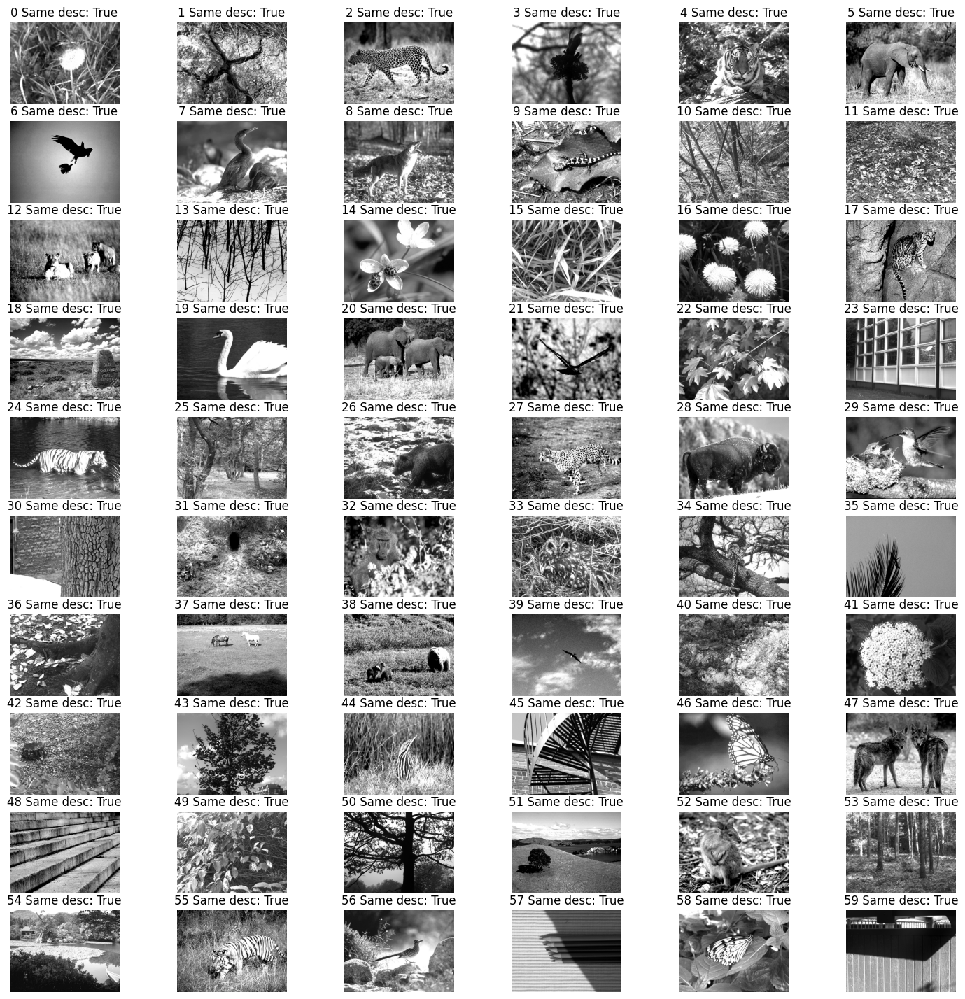

In [46]:
fig, axes = plt.subplots(10,6,figsize=(18,18))

# fig, ax = plt.subplots(figsize=(10,10))
for i in range(60):
    image_index = meta['image_index'][i]
    iPlot = i
    ax = axes[iPlot//6, iPlot%6]
    ax.imshow(tif_stack[i,:,:], cmap='gray')
    # ax.set_title(f"{image_index}\n{meta['image_description'][i]}\n{meta['image_description'][image_index]}")
    same_desc = meta['image_description'][i] == meta['image_description'][image_index]
    ax.set_title(f"{image_index} Same desc: {same_desc}")
    ax.axis('off')
plt.show()

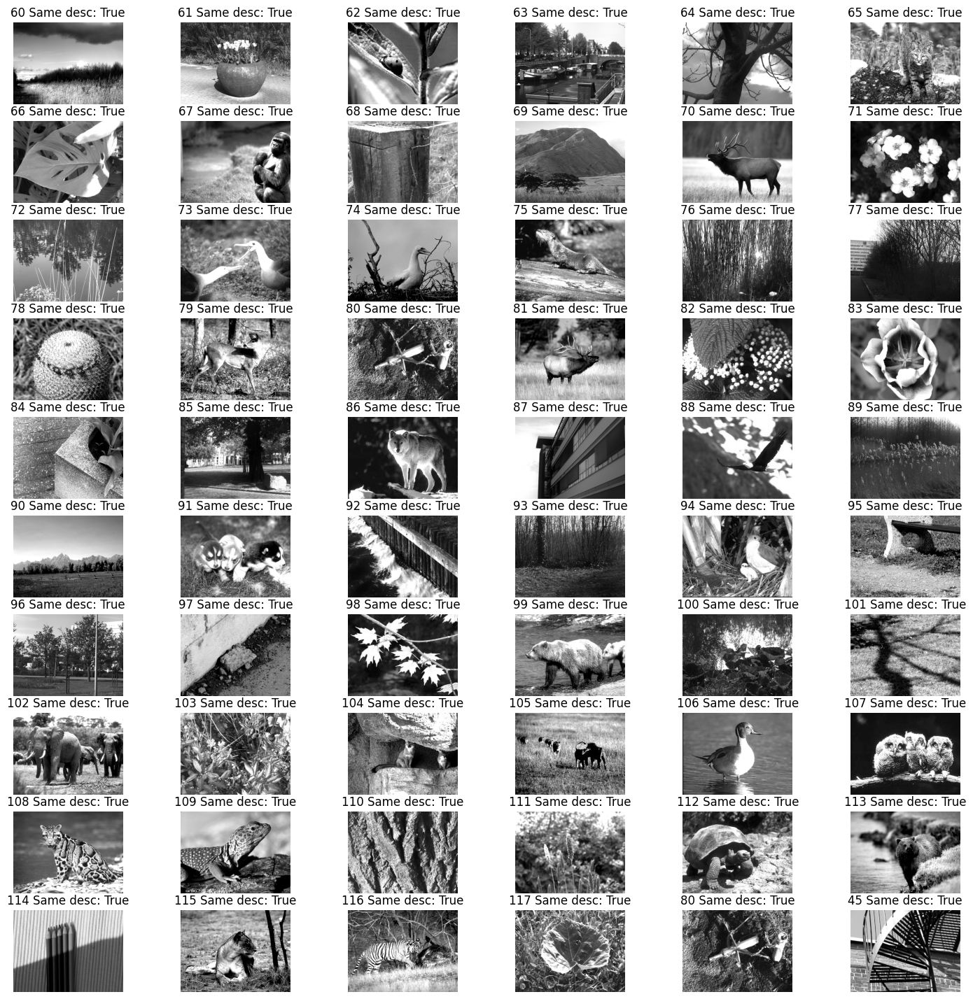

In [35]:
fig, axes = plt.subplots(10,6,figsize=(18,18))

# fig, ax = plt.subplots(figsize=(10,10))
for i in range(60,120):
    image_index = meta['image_index'][i]
    iPlot = i - 60
    ax = axes[iPlot//6, iPlot%6]
    ax.imshow(tif_stack[i,:,:], cmap='gray')
    # ax.set_title(f"{image_index}\n{meta['image_description'][i]}\n{meta['image_description'][image_index]}")
    same_desc = meta['image_description'][i] == meta['image_description'][image_index]
    ax.set_title(f"{image_index} Same desc: {same_desc}")
    ax.axis('off')
plt.show()

In [ ]:
testNWB_path = "/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/real_nwbs/M409828_11_20181212.nwb"
testNWB_path = "/data/v1dd_in_vivo_new_segmentation/REAL_nwbs/M409828_13_20181213.nwb"
io = NWBHDF5IO(testNWB_path, "r")
nwb = io.read()
nwb

In [15]:
testNWB_path = "/data/v1dd_in_vivo_new_segmentation/REAL_nwbs/M409828_13_20181213.nwb.zarr"
testNWB_path = "/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/real_nwbs/M438833_1a_20190408.nwb.zarr"
io = NWBZarrIO(testNWB_path, 'r+',load_namespaces=False)
nwb = io.read()
# nwb.imaging_planes['plane-0'].imaging_rate = 6.6
nwb

root pynwb.file.NWBFile at 0x133199667264080
Fields:
  acquisition: {
    vasculature_maps <class 'pynwb.base.Images'>
  }
  devices: {
    DEEPSCOPE <class 'pynwb.device.Device'>
  }
  epochs: epochs <class 'pynwb.epoch.TimeIntervals'>
  experiment_description: 3-photon imaging of column 1, volume a
  file_create_date: [datetime.datetime(2025, 8, 11, 16, 52, 54, 64095, tzinfo=tzoffset(None, -25200))]
  identifier: ee6c0a62-f7d6-46c1-a323-27f306e94915
  imaging_planes: {
    plane-0 <class 'pynwb.ophys.ImagingPlane'>
  }
  institution: Allen Institute
  intervals: {
    epochs <class 'pynwb.epoch.TimeIntervals'>,
    stimulus_table <class 'pynwb.epoch.TimeIntervals'>
  }
  keywords: <zarr.core.Array '/general/keywords' (4,) object>
  processing: {
    behavior <class 'pynwb.base.ProcessingModule'>,
    plane-0 <class 'pynwb.base.ProcessingModule'>
  }
  session_description: V1 Deep Dive, 2p Mouse, M438833
  session_id: 868512099
  session_start_time: 2019-04-08 09:00:00-07:00
  stimulus: {
    locally_sparse_noise <class 'pynwb.base.Images'>,
    natural_images <class 'pynwb.base.Images'>,
    natural_movie <class 'pynwb.base.Images'>
  }
  subject: subject pynwb.file.Subject at 0x133199499554384
Fields:
  age: 128
  age__reference: birth
  description: 2p Mouse, M438833
  genotype: Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94
  sex: male
  species: Mus musculus
  subject_id: 438833

  timestamps_reference_time: 2019-04-08 09:00:00-07:00

In [13]:
nwb.imaging_planes['plane-0'].imaging_rate

np.float64(6.0)

In [9]:
import h5py 

with h5py.File(testNWB_path, 'r') as f:
    print(f.keys())

IsADirectoryError: [Errno 21] Unable to synchronously open file (file read failed: time = Tue Aug 12 08:49:40 2025
, filename = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/real_nwbs/3p/M409828_16_20190109.nwb.zarr', file descriptor = 79, errno = 21, error message = 'Is a directory', buf = 0x7fff11c5ce98, total read size = 8, bytes this sub-read = 8, offset = 0)

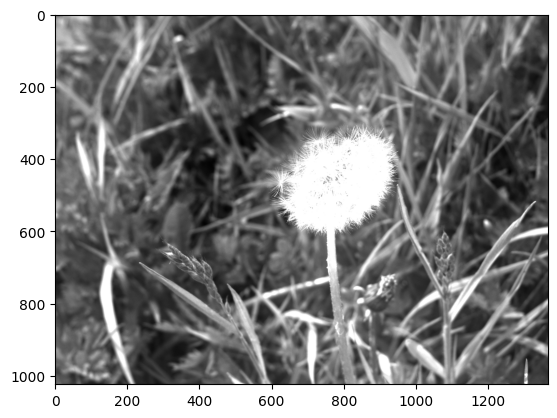

In [19]:
plt.imshow(np.array(nwb.stimulus['natural_images'].images['0']),cmap='gray')
plt.show()

In [13]:
pika_thresh = 0.5
for plane in range(6):

    tmp_df = nwb.processing[f'plane-{plane}']['image_segmentation']['roi_table'].to_dataframe()
    N = len(tmp_df)
    # n = np.sum(tmp_df['pika_roi_confidence'] >= pika_thresh)
    n = np.sum(tmp_df['is_soma'])
    print(f'plane-{plane} has {N:4d} ROIs, {n:3d} with pika confidence >= {pika_thresh} {n*100/N:.2f}')


plane-0 has 1234 ROIs, 409 with pika confidence >= 0.5 33.14
plane-1 has 1222 ROIs, 470 with pika confidence >= 0.5 38.46
plane-2 has 1482 ROIs, 483 with pika confidence >= 0.5 32.59
plane-3 has 1279 ROIs, 478 with pika confidence >= 0.5 37.37
plane-4 has 1158 ROIs, 438 with pika confidence >= 0.5 37.82
plane-5 has 1148 ROIs, 430 with pika confidence >= 0.5 37.46


In [12]:
HDF5_fpath = "/data/v1dd_in_vivo_new_segmentation/REAL_nwbs/M409828_13_20181213.nwb"
ZARR_fpath = "/data/v1dd_in_vivo_new_segmentation/REAL_nwbs/M409828_13_20181213.nwb.zarr"

In [13]:
with NWBHDF5IO(HDF5_fpath, 'r', load_namespaces=False) as read_io:  # Create HDF5 IO object for read
    with NWBZarrIO(ZARR_fpath, mode='w') as export_io:              # Create Zarr IO object for write
        export_io.export(src_io=read_io, write_args=dict(link_data=False))   # Export from HDF5 to Zarr

In [14]:
zr = NWBZarrIO(ZARR_fpath, 'r')
zf = zr.read()
zf

root pynwb.file.NWBFile at 0x126313059276688
Fields:
  acquisition: {
    vasculature_maps <class 'pynwb.base.Images'>
  }
  devices: {
    DEEPSCOPE <class 'pynwb.device.Device'>
  }
  epochs: epochs <class 'pynwb.epoch.TimeIntervals'>
  experiment_description: 2-photon imaging of column 1, volume 3
  file_create_date: [datetime.datetime(2025, 8, 6, 12, 43, 48, 754610, tzinfo=tzoffset(None, -25200))]
  identifier: f4e17ee7-90ea-49fa-8db5-a3b26003feb9
  imaging_planes: {
    plane-0 <class 'pynwb.ophys.ImagingPlane'>,
    plane-1 <class 'pynwb.ophys.ImagingPlane'>,
    plane-2 <class 'pynwb.ophys.ImagingPlane'>,
    plane-3 <class 'pynwb.ophys.ImagingPlane'>,
    plane-4 <class 'pynwb.ophys.ImagingPlane'>,
    plane-5 <class 'pynwb.ophys.ImagingPlane'>
  }
  institution: Allen Institute
  intervals: {
    epochs <class 'pynwb.epoch.TimeIntervals'>,
    stimulus_table <class 'pynwb.epoch.TimeIntervals'>
  }
  keywords: <zarr.core.Array '/general/keywords' (4,) object read-only>
  processing: {
    behavior <class 'pynwb.base.ProcessingModule'>,
    plane-0 <class 'pynwb.base.ProcessingModule'>,
    plane-1 <class 'pynwb.base.ProcessingModule'>,
    plane-2 <class 'pynwb.base.ProcessingModule'>,
    plane-3 <class 'pynwb.base.ProcessingModule'>,
    plane-4 <class 'pynwb.base.ProcessingModule'>,
    plane-5 <class 'pynwb.base.ProcessingModule'>
  }
  session_description: V1 Deep Dive, Golden Mouse
  session_id: 794964451
  session_start_time: 2018-12-13 09:00:00-08:00
  stimulus: {
    locally_sparse_noise <class 'pynwb.base.Images'>,
    natural_images <class 'pynwb.base.Images'>,
    natural_movie <class 'pynwb.base.Images'>
  }
  subject: subject pynwb.file.Subject at 0x126307506279632
Fields:
  age: 163
  age__reference: birth
  description: Golden Mouse
  genotype: Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94
  sex: male
  species: Mus musculus
  subject_id: 409828

  timestamps_reference_time: 2018-12-13 09:00:00-08:00

In [ ]:
df_list = []
for stim_name in sess.stim_list:
    stim_table, stim_meta = sess.get_stimulus_table(stim_name)
    stim_table2 = stim_table.copy()
    stim_table2['start_time'] = stim_table2['start']
    stim_table2['stop_time'] = stim_table2['end']
    stim_table2['stim_name'] = stim_name
    stim_table3 = _configure_stimulus_table(stim_table2)
    df_list.append(stim_table3)
df = pd.concat(df_list, ignore_index=True)
df_sort = df.sort_values(by=['start_time'])

stimulus_df = df_sort.reset_index(drop=True)
stimulus_df

stimulus_df['stimulus_condition_id'] = 0
stim_cond_dict = stimulus_df.groupby(['stim_name','temporal_frequency','spatial_frequency','direction','frame','image_index'],dropna=False).indices
for ii, (stim_key, stim_indices) in enumerate(stim_cond_dict.items()):
    stimulus_df.loc[stim_indices,'stimulus_condition_id'] = ii

stim_cols = ['stim_name','start_time', 'stop_time', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image','image_index','stimulus_condition_id'] 
trial_table = TimeIntervals(
    name='stimulus_table',
    description=f"Trial times & parameters all stimulus",
    columns=[{"name": col, "description": col} for col in stim_cols]
)
for iT, row in stimulus_df.iterrows():
    trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
        temporal_frequency=row['temporal_frequency'],spatial_frequency=row['spatial_frequency'],direction=row['direction'],
        frame=row['frame'], image=row['image'], image_index=row['image_index'],stimulus_condition_id=row['stimulus_condition_id'])
nwbfile.add_time_intervals(trial_table)


In [ ]:
nwbfile.intervals['stimulus_table'].to_dataframe().head()


In [ ]:
for stim_name in sess.stim_list:
    stim_table, stim_meta = sess.get_stimulus_table(stim_name)
    # stim_table['stim_name'] = stim_name
    print(stim_name, stim_table.columns.tolist())

In [ ]:
stim_table, stim_meta = sess.get_stimulus_table('natural_movie')
stim_table

In [ ]:
tmp_list = stim_table.columns.tolist()
tmp_list.pop(0)
tmp_list.pop(0)
tmp_cols = np.concatenate((['start_time','stop_time'],tmp_list)).tolist()
tmp_cols

In [ ]:
# Add stimulus table for drifting gratings
for stim_name in ['drifting_gratings_full','drifting_gratings_windowed']:
    stim_table, stim_meta = sess.get_stimulus_table(stim_name)
    stim_table2 = stim_table.copy()
    stim_table2['stim_name'] = stim_name
    stim_table2['start_time'] = stim_table2['start']
    stim_table2['stop_time'] = stim_table2['end']

    tmp_list = stim_table2.columns.tolist()
    tmp_list.pop(0)
    tmp_list.pop(0)
    tmp_cols = tmp_list
    trial_table = TimeIntervals(
        name=stim_name,
        description=f"Trial times & parameters for {stim_name} stimulus",
        columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in tmp_cols]
    )
    for iT, row in stim_table2.iterrows():
        trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
            temporal_frequency=row['temporal_frequency'],spatial_frequency=row['spatial_frequency'],direction=row['direction'])
    nwbfile.add_time_intervals(trial_table)


In [ ]:

# add stimulus table for natural scenes
for stim_name in ['natural_images','natural_images_12']:
    stim_table, stim_meta = sess.get_stimulus_table(stim_name)
    stim_table2 = stim_table.copy()
    stim_table2['stim_name'] = stim_name
    stim_table2['start_time'] = stim_table2['start']
    stim_table2['stop_time'] = stim_table2['end']

    tmp_list = stim_table2.columns.tolist()
    tmp_list.pop(0)
    tmp_list.pop(0)
    tmp_cols = tmp_list
    trial_table = TimeIntervals(
        name=stim_name,
        description=f"Trial times & parameters for {stim_name} stimulus",
        columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in tmp_cols]
    )
    for iT, row in stim_table2.iterrows():
        trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
            image=row['image'],image_index=row['image_index'])
    nwbfile.add_time_intervals(trial_table)

In [ ]:

# add stimulus table for natural movies
for stim_name in ['natural_movie','locally_sparse_noise']:
    stim_table, stim_meta = sess.get_stimulus_table(stim_name)
    stim_table2 = stim_table.copy()
    stim_table2['stim_name'] = stim_name
    stim_table2['start_time'] = stim_table2['start']
    stim_table2['stop_time'] = stim_table2['end']

    tmp_list = stim_table2.columns.tolist()
    tmp_list.pop(0)
    tmp_list.pop(0)
    tmp_cols = tmp_list
    trial_table = TimeIntervals(
        name=stim_name,
        description=f"Trial times & parameters for {stim_name} stimulus",
        columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in tmp_cols]
    )
    for iT, row in stim_table2.iterrows():
        trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
            frame=row['frame'])
    nwbfile.add_time_intervals(trial_table)

In [ ]:
nwbfile.intervals['natural_movie'].to_dataframe().head()

In [ ]:
stim_table.columns.tolist()

In [ ]:
row

In [ ]:
stim_table

In [ ]:
nwbfile

In [ ]:
for stim_name in sess.stim_list:
    stim_table, stim_meta = sess.get_stimulus_table(stim_name)

    # Create a TimeIntervals table
    trial_table = TimeIntervals(
        name=stim_name,
        description=f"Trial times & parameters for {stim_name} stimulus",
        columns=['stim_name','start', 'end', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image','image_index'] ,
    )
trial_table

In [ ]:
stim_cols = ['stim_name','start', 'end', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image','image_index'] 
trial_table = TimeIntervals(
    name=stim_name,
    description=f"Trial times & parameters for {stim_name} stimulus",
    columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in stim_table.columns.tolist()]
)

for iT, row in stim_table.iterrows():
    trial_table.add_row(
        start=row['start'],
        end=row['end'],
        temporal_frequency=row['temporal_frequency'],
        spatial_frequency=row['spatial_frequency'],
        direction=row['orientation']
    )

In [ ]:
for stim_name in sess.stim_list:
    stim_table, stim_meta = sess.get_stimulus_table(stim_name)

    trial_table = TimeIntervals(
        name=stim_name,
        description=f"Trial times & parameters for {stim_name} stimulus",
        columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in stim_table.columns.tolist()]
    )
    for iT, row in stim_table.iterrows():
        pdb.set_trace()
        trial_table.add_row(
            start=row['start'],
            end=row['end'],
            temporal_frequency=row['temporal_frequency'],
            spatial_frequency=row['spatial_frequency'],
            direction=row['orientation']
        )

## Create 3p NWB files

In [ ]:
all_session_keys = list(sesses.keys())
only_2p_sessions = list(sesses_2p.keys())


In [ ]:
sesses

In [ ]:
microscope_2p_id = 722885523
microscope_3p_id = 762899596
for m_key, mID_dict in meta.items():
    if m_key == 'slc1':
        continue

    mID = mID_dict['mouse_id']
    genotype = mID_dict['genotype']
    gender = mID_dict['gender']
    dob = mID_dict['date_of_birth']
    prod = mID_dict['prod']

    dob_dt = datetime(int(dob[0:4]), int(dob[4:6]), int(dob[6:8]), tzinfo=tz.gettz("US/Pacific"))
    if mID == '409828':
        mouse_desc = 'Golden Mouse'
    else:
        mouse_desc = f'2p Mouse, M{mID}'
    print(f'\nprocessing mouse_id: {mID} ...')

    sesses = jun.get_all_sessions(mID)
    sesses_2p = jun.pick_2p_sessions(sesses)

    all_session_keys = list(sesses.keys())
    only_2p_sessions = list(sesses_2p.keys())
    three_photon_keys = np.setxor1d(all_session_keys, only_2p_sessions)
    for sn in three_photon_keys:

        print(f'\tadding session: {sn} ...')
        smeta = sesses[sn]
        col = smeta['column']
        vol = smeta['volume']

        # Read in ophys session using V1DD client
        sess = client.load_ophys_session(mouse=mID, column=col, volume=vol)
        nwb_path = sess.nwb_file_path
        date = nwb_path.split('/')[-1].split('_')[-1].split('.')[0]
        # date = smeta['date']

        lims_path = jun.get_lims_session_path(
            sess=smeta, 
            prod=prod, 
            btv_path="/allen/programs/braintv"
            )
        
        #Get session start time
        #TODOLIST: this is hardcoded to 9am, need to get from LIMS or somewhere
        session_start_time = datetime(int(date[0:4]),int(date[4:6]),int(date[6:8]),9,0,0,tzinfo=tz.gettz("US/Pacific"))
        age_at_session = (session_start_time - dob_dt).days

        # Read in fake NWB file
        fake_nwb_path = sess.nwb_file_path
        fake_nwb = h5py.File(fake_nwb_path, 'r')


        #Create new NWB file
        nwbfile = NWBFile(
            session_description=f"V1 Deep Dive, {mouse_desc}",  
            identifier=str(uuid4()),  
            session_start_time=session_start_time,  # required
            session_id=smeta['session'],  
            institution="Allen Institute",  
            experiment_description=f"3-photon imaging of column {col}, volume {vol}",  
            keywords=["V1", "2p", "visual coding","multi-plane"],
            file_create_date=datetime.now(tz=tz.gettz("US/Pacific")),
        )

        #Add subject information
        subject = Subject(
                subject_id=mID,
                age=str(age_at_session),
                description=mouse_desc,
                genotype=genotype,
                species="Mus musculus",
                sex=gender,
            )
        nwbfile.subject = subject

        # #Add acquisition timeseries
        # acq_keys = list(fake_nwb['acquisition']['timeseries'].keys())

        # Add images
        acq_keys = list(fake_nwb['acquisition']['images'].keys())
        img_list = [GrayscaleImage(name=key,data=np.array(fake_nwb['acquisition']['images'][key])) for key in acq_keys]

        images = Images(
            name="vasculature_maps",
            images=img_list,
            description="WF & 2p images of vasculature",
        )
        nwbfile.add_acquisition(images)

        ##------------------------------------------
        # Add behavior
        behavior_module = nwbfile.create_processing_module(name="behavior", description="processed behavioral data")

        # Speed
        speed_xr = sess.get_running_speed()
        running_speed = TimeSeries(
            name="running_speed",
            description="Running speed of animal on wheel",
            data=speed_xr.data,
            unit="cm/s",
            timestamps=speed_xr['time'].values,
        )
        behavior_module.add(running_speed)

        #Pupil
        pupil_data = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['data'])
        eye_ts = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['timestamps'])
        cornea_ellipse = pupil_data[:,:5]
        pupil_ellipse = pupil_data[:,10:15]

        col_ts = VectorData(name='timestamps',description='Timestamps for pupil tracking data',data=eye_ts)
        col1 = VectorData(name='ellipse_long_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 2])
        col2 = VectorData(name='ellipse_short_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 3])
        col3 = VectorData(name='area',description='Pupil area calculated from the ellipse parameters',data=np.pi * pupil_ellipse[:,2] * pupil_ellipse[:,3])

        # Add pupil area as a table
        behavior_module.add(DynamicTable(
            name='pupil',
            description='DLC pupil tracking data',
            columns=[col_ts, col1, col2, col3]
        ))

        col1 = VectorData(name='ellipse_long_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 2])
        col2 = VectorData(name='ellipse_short_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 3])
        col3 = VectorData(name='area',description='Corneal area calculated from the ellipse parameters',data=np.pi * cornea_ellipse[:,2] * cornea_ellipse[:,3])

        # Add corneal area as a table
        behavior_module.add(DynamicTable(
            name='corneal_reflection',
            description='DLC corneal tracking data',
            columns=[col_ts,col1, col2, col3]
        ))

        #
        device = nwbfile.create_device(
            name="DEEPSCOPE",
            description=f"Two-photon microscope used for imaging in V1DD, equipment_id = {microscope_2p_id}",
            manufacturer="Thorlabs")
        optical_channel = OpticalChannel(name="TODO",description="TODO",emission_lambda=514.0)
        
        ##------------------------------------------
        # Epoch table
        tmp_list = []
        for stim_name in sess.stim_list:
            stim_table, stim_meta = sess.get_stimulus_table(stim_name)

            start_times = stim_table['start'].values
            end_times = stim_table['end'].values
            start_diffs = np.diff(start_times)
            indy = np.where(start_diffs > 10)[0]

            if len(indy) == 0:

                tMin = stim_table['start'].min()
                tMax = stim_table['end'].max()
                tmp_list.append((stim_name, tMin, tMax))
            else:
                idx = indy[0]+1
                tMin = start_times[:idx].min()
                tMax = end_times[:idx].max()
                tmp_list.append((stim_name, tMin, tMax))
                

                tMin = start_times[idx:].min()
                tMax = end_times[idx:].max()
                tmp_list.append((stim_name, tMin, tMax))

        epoch_df = pd.DataFrame(tmp_list, columns=['stim_name', 'start_time', 'stop_time'])
        epoch_df['duration'] = epoch_df['stop_time'] - epoch_df['start_time']
        epoch_df = epoch_df.sort_values(by=['start_time'])
        epoch_df = epoch_df.reset_index(drop=True)

        trial_table = TimeIntervals(
            name='epochs',
            description=f"Start and stop times for all stimulus epochs",
            columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in epoch_df.columns.tolist()]
        )
        for iT, row in epoch_df.iterrows():
            trial_table.add_row(stim_name=row['stim_name'],
                start_time=row['start_time'],
                stop_time=row['stop_time'],
                duration=row['duration'])
        nwbfile.add_time_intervals(trial_table)

        ##------------------------------------------
        # Stimulus table
        df_list = []
        for stim_name in sess.stim_list:
            stim_table, stim_meta = sess.get_stimulus_table(stim_name)
            stim_table2 = stim_table.copy()
            stim_table2['start_time'] = stim_table2['start']
            stim_table2['stop_time'] = stim_table2['end']
            stim_table2['stim_name'] = stim_name
            stim_table3 = _configure_stimulus_table(stim_table2)
            df_list.append(stim_table3)
        df = pd.concat(df_list, ignore_index=True)
        df_sort = df.sort_values(by=['start_time'])
        stimulus_df = df_sort.reset_index(drop=True)
        stimulus_df['stimulus_condition_id'] = 0
        stim_cond_dict = stimulus_df.groupby(['stim_name','temporal_frequency','spatial_frequency','direction','frame','image_index'],dropna=False).indices
        for ii, (stim_key, stim_indices) in enumerate(stim_cond_dict.items()):
            stimulus_df.loc[stim_indices,'stimulus_condition_id'] = ii

        stim_cols = ['stim_name','start_time', 'stop_time', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image','image_index','stimulus_condition_id'] 
        trial_table = TimeIntervals(
            name='stimulus_table',
            description=f"Trial times & parameters all stimulus",
            columns=[{"name": col, "description": col} for col in stim_cols]
        )
        for iT, row in stimulus_df.iterrows():
            trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
                temporal_frequency=row['temporal_frequency'],spatial_frequency=row['spatial_frequency'],direction=row['direction'],
                frame=row['frame'], image=row['image'], image_index=row['image_index'],stimulus_condition_id=row['stimulus_condition_id'])
        nwbfile.add_time_intervals(trial_table)

        ##------------------------------------------
        # Add 2p time series data per plane
        # for plane in sess.get_planes():
        nPlanes = len(sess.get_planes())
        for plane in range(nPlanes):
            # Extract plane data from fake NWB
            dumb_key = f'rois_and_traces_plane{plane}'

            depth = int(np.array(fake_nwb['processing'][dumb_key]['imaging_depth_micron']))
            exp_desc = str(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['description']))[2:-1]
            img_height = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_height']))
            img_width = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_width']))
            pipeline_roi_names = np.array([str(f)[2:-1] for f in np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['pipeline_roi_names'])])
            ref_image_keys = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'])
            
            # Create imaging plane with appropriate metadata
            ophys_module = nwbfile.create_processing_module(name=f'plane{plane}', description="Single-plane ophys processing module")
            imaging_plane = nwbfile.create_imaging_plane(
                name=f'plane{plane}',
                optical_channel=optical_channel,
                imaging_rate=6.0,
                description="2-photon imaging plane",
                device=device,
                excitation_lambda=514.0,
                unit="",
                location="V1",
                indicator="gcamp6s",
                grid_spacing=[1.0, 1.0],  # Update if available
                origin_coords=[0.0, 0.0, 0.0],
                origin_coords_unit=str(depth))
            
            # Add raw images to NWB file
            # two_p_series = TwoPhotonSeries(
            #     name="TwoPhotonSeries",
            #     description="Raw 2p data",
            #     data=np.ones((1000, 100, 100)),
            #     imaging_plane=imaging_plane,
            #     rate=1.0,
            #     unit="normalized amplitude",
            # )
            # nwbfile.add_acquisition(two_p_series)

            # Add ROI masks
            roi_ids = sess.get_rois(plane+1)
            img_seg = ImageSegmentation()
            ps = img_seg.create_plane_segmentation(
                name=f"roi_table",
                description="output from suite2p for plane{plane}",
                imaging_plane=imaging_plane,
                columns=[
                VectorData(name="column",description="column"),
                VectorData(name="volume",description="volume"),
                VectorData(name="plane",description="plane"),
                VectorData(name="roi",description="roi"),
                VectorData(name="pika_roi_id",description="pika_roi_id"),
                VectorData(name="pika_roi_confidence",description="pika_roi_confidence"),
                VectorData(name="is_soma",description="Soma predictions")],
            colnames=["column","volume","plane","roi",
                      "pika_roi_id","pika_roi_confidence","is_soma"],
            )

            pika_roi_ids = sess.get_pika_roi_ids(plane+1)
            pika_roi_confidence = sess.get_pika_roi_confidence(plane+1)
            for iR, r in enumerate(sess.get_rois(plane+1)):
                ix, iy = sess.get_roi_xy_pixels(plane+1,r)
                iw = np.ones(ix.shape)
                pixel_mask = np.stack((ix,iy,iw)).T
                is_soma = pika_roi_confidence[iR] > 0.5  
                ps.add_roi(pixel_mask=pixel_mask,id=r,column=col,volume=vol,plane=plane,roi=r,pika_roi_id=pika_roi_ids[iR],
                           pika_roi_confidence=pika_roi_confidence[iR],is_soma=is_soma)

            ophys_module.add(ps)
            roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")
            # pdb.set_trace()
            # Add projections and images
            img_list = []
            for key in ref_image_keys:
                ref_image = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'][key]['data'])
                max_img = GrayscaleImage(
                    name=key,
                    data=ref_image,
                    resolution=1.0,  # Update if available
                    description=key,
                )
                img_list.append(max_img)

            images = Images(
                name="reference_images",
                images=img_list,
                description="Summary images of the ophys movie",
            )
            ophys_module.add(images)

            # Add fluorescence traces
            trace_xr = sess.get_traces(plane+1,'raw')
            raw_traces = RoiResponseSeries(
                name="fluorescence",
                data=trace_xr.data,
                rois=roi_names,
                unit="a.u.",
                timestamps=trace_xr.time.values
            )
            # ophys_module.add(Fluorescence(roi_response_series=raw_traces, name="raw"))

            # add neuropil traces
            neuropil_xr = sess.get_traces(plane+1,'neuropil')
            neuropil_traces = RoiResponseSeries(
                name="neuropil_fluorescence",
                data=neuropil_xr.data,
                rois=roi_names,
                unit="a.u.",
                timestamps=neuropil_xr.time.values
            )
            # ophys_module.add(neuropil_traces)

            # add neuropixl corrected traces
            neuropil_xr = sess.get_traces(plane+1,'subtracted',valid_only=False)
            neuropil_sub_traces = RoiResponseSeries(
                name="neuropil_subtracted",
                data=neuropil_xr.data,
                rois=roi_names,
                unit="a.u.",
                timestamps=neuropil_xr.time.values
            )
            # ophys_module.add(neuropil_traces)

            # add demixed traces
            demixed_xr = sess.get_traces(plane+1,'demixed',valid_only=False)
            demixed_traces = RoiResponseSeries(
                name="demixed",
                data=demixed_xr.data,
                rois=roi_names,
                unit="a.u.",
                timestamps=demixed_xr.time.values
            )
            # ophys_module.add(demixed_traces)
            ophys_module.add(Fluorescence(roi_response_series=[raw_traces,neuropil_traces,neuropil_sub_traces,demixed_traces]))

            # add dff traces
            dff_xr = sess.get_traces(plane+1,'dff',valid_only=False,)
            dfof_traces_series = RoiResponseSeries(
                name="dff",
                data=dff_xr.data,
                rois=roi_names,
                unit="%",
                timestamps=dff_xr.time.values
            )
            ophys_module.add(DfOverF(roi_response_series=dfof_traces_series))

            # add event traces
            event_xr = sess.get_traces(plane+1,'events',valid_only=False)
            event_traces_series = RoiResponseSeries(
                name="event",
                data=event_xr.data,
                rois=roi_names,
                unit="a.u.",
                timestamps=dff_xr.time.values
            )

            ophys_module.add(event_traces_series)

            # ophys_module.add(dfof_traces_series))
            # pdb.set_trace()
        # write new NWB object to file
        io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb'), mode="w")
        io.write(nwbfile)
        io.close()
        pdb.set_trace()

        
        # plane_depth = smeta['depth']

In [ ]:
nwbfile.processing['DfOverF']

In [ ]:
nwbfile.processing['plane0']['roi_table'].to_dataframe().head()

In [ ]:
sess = client.load_ophys_session(mouse=mID, column=col, volume=vol)

In [ ]:
nwb_path = sess.nwb_file_path
date = nwb_path.split('/')[-1].split('_')[-1].split('.')[0]
date

In [ ]:
sess.date

# Investigate deconvolution

In [ ]:
meta

In [ ]:
sesses

In [ ]:
microscope_2p_id = 722885523
microscope_3p_id = 762899596
# for m_key, mID_dict in meta.items():
   
#     if m_key == 'slc1':
#         continue
m_key = 'slc2'; mID_dict = meta[m_key]
mID = mID_dict['mouse_id']
genotype = mID_dict['genotype']
gender = mID_dict['gender']
dob = mID_dict['date_of_birth']
prod = mID_dict['prod']

dob_dt = datetime(int(dob[0:4]), int(dob[4:6]), int(dob[6:8]), tzinfo=tz.gettz("US/Pacific"))
if mID == '409828':
    mouse_desc = 'Golden Mouse'
else:
    mouse_desc = f'2p Mouse, M{mID}'
print(f'\nprocessing mouse_id: {mID} ...')

sesses = jun.get_all_sessions(mID)
sesses_2p = jun.pick_2p_sessions(sesses)
# pdb.set_trace()
# for sn, smeta in sesses_2p.items():
sn = '13'; smeta = sesses_2p[sn]
print(f'\tadding session: {sn} ...')
col = smeta['column']
vol = smeta['volume']
date = smeta['date']
lims_path = jun.get_lims_session_path(
    sess=smeta, 
    prod=prod, 
    btv_path="/allen/programs/braintv"
    )

#Get session start time
#TODOLIST: this is hardcoded to 9am, need to get from LIMS or somewhere
session_start_time = datetime(int(date[0:4]),int(date[4:6]),int(date[6:8]),9,0,0,tzinfo=tz.gettz("US/Pacific"))
age_at_session = (session_start_time - dob_dt).days

# Read in fake NWB file
fake_nwb_path = os.path.join(base_folder,'nwbs','processed',f'M{mID}_{col}{vol}_{date}.nwb')
fake_nwb = h5py.File(fake_nwb_path, 'r')

# Read in ophys session using V1DD client
sess = client.load_ophys_session(mouse=mID, column=col, volume=vol)

# #Create new NWB file
# nwbfile = NWBFile(
#     session_description=f"V1 Deep Dive, {mouse_desc}",  
#     identifier=str(uuid4()),  
#     session_start_time=session_start_time,  # required
#     session_id=smeta['session'],  
#     institution="Allen Institute",  
#     experiment_description=f"2-photon imaging of column {col}, volume {vol}",  
#     keywords=["V1", "2p", "visual coding","multi-plane"],
#     file_create_date=datetime.now(tz=tz.gettz("US/Pacific")),
# )

# #Add subject information
# subject = Subject(
#         subject_id=mID,
#         age=str(age_at_session),
#         description=mouse_desc,
#         genotype=genotype,
#         species="Mus musculus",
#         sex=gender,
#     )
# nwbfile.subject = subject

# # #Add acquisition timeseries
# # acq_keys = list(fake_nwb['acquisition']['timeseries'].keys())

# # Add images
# acq_keys = list(fake_nwb['acquisition']['images'].keys())
# img_list = [GrayscaleImage(name=key,data=np.array(fake_nwb['acquisition']['images'][key])) for key in acq_keys]

# images = Images(
#     name="vasculature_maps",
#     images=img_list,
#     description="WF & 2p images of vasculature",
# )
# nwbfile.add_acquisition(images)

# ##------------------------------------------
# # Add behavior
# behavior_module = nwbfile.create_processing_module(name="behavior", description="processed behavioral data")

# # Speed
# speed_xr = sess.get_running_speed()
# running_speed = TimeSeries(
#     name="running_speed",
#     description="Running speed of animal on wheel",
#     data=speed_xr.data,
#     unit="cm/s",
#     timestamps=speed_xr['time'].values,
# )
# behavior_module.add(running_speed)

# #Pupil
# pupil_data = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['data'])
# eye_ts = np.array(fake_nwb['processing']['eye_tracking_right']['PupilTracking']['eyetracking']['timestamps'])
# cornea_ellipse = pupil_data[:,:5]
# pupil_ellipse = pupil_data[:,10:15]

# col_ts = VectorData(name='timestamps',description='Timestamps for pupil tracking data',data=eye_ts)
# col1 = VectorData(name='ellipse_long_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 2])
# col2 = VectorData(name='ellipse_short_axis',description='Pupil ellipse parameters',data=pupil_ellipse[:, 3])
# col3 = VectorData(name='area',description='Pupil area calculated from the ellipse parameters',data=np.pi * pupil_ellipse[:,2] * pupil_ellipse[:,3])

# # Add pupil area as a table
# behavior_module.add(DynamicTable(
#     name='pupil',
#     description='DLC pupil tracking data',
#     columns=[col_ts, col1, col2, col3]
# ))

# col1 = VectorData(name='ellipse_long_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 2])
# col2 = VectorData(name='ellipse_short_axis',description='Corneal ellipse parameters',data=cornea_ellipse[:, 3])
# col3 = VectorData(name='area',description='Corneal area calculated from the ellipse parameters',data=np.pi * cornea_ellipse[:,2] * cornea_ellipse[:,3])

# # Add corneal area as a table
# behavior_module.add(DynamicTable(
#     name='corneal_reflection',
#     description='DLC corneal tracking data',
#     columns=[col_ts,col1, col2, col3]
# ))

# #
# device = nwbfile.create_device(
#     name="DEEPSCOPE",
#     description=f"Two-photon microscope used for imaging in V1DD, equipment_id = {microscope_2p_id}",
#     manufacturer="Thorlabs")
# optical_channel = OpticalChannel(name="TODO",description="TODO",emission_lambda=514.0)

# ##------------------------------------------
# # Epoch table
# tmp_list = []
# for stim_name in sess.stim_list:
#     stim_table, stim_meta = sess.get_stimulus_table(stim_name)

#     start_times = stim_table['start'].values
#     end_times = stim_table['end'].values
#     start_diffs = np.diff(start_times)
#     indy = np.where(start_diffs > 10)[0]

#     if len(indy) == 0:

#         tMin = stim_table['start'].min()
#         tMax = stim_table['end'].max()
#         tmp_list.append((stim_name, tMin, tMax))
#     else:
#         idx = indy[0]+1
#         tMin = start_times[:idx].min()
#         tMax = end_times[:idx].max()
#         tmp_list.append((stim_name, tMin, tMax))
        

#         tMin = start_times[idx:].min()
#         tMax = end_times[idx:].max()
#         tmp_list.append((stim_name, tMin, tMax))

# epoch_df = pd.DataFrame(tmp_list, columns=['stim_name', 'start_time', 'stop_time'])
# epoch_df['duration'] = epoch_df['stop_time'] - epoch_df['start_time']
# epoch_df = epoch_df.sort_values(by=['start_time'])
# epoch_df = epoch_df.reset_index(drop=True)

# trial_table = TimeIntervals(
#     name='epochs',
#     description=f"Start and stop times for all stimulus epochs",
#     columns=[{"name": col, "description": f"{col} for {stim_name} stimulus"} for col in epoch_df.columns.tolist()]
# )
# for iT, row in epoch_df.iterrows():
#     trial_table.add_row(stim_name=row['stim_name'],
#         start_time=row['start_time'],
#         stop_time=row['stop_time'],
#         duration=row['duration'])
# nwbfile.add_time_intervals(trial_table)

# ##------------------------------------------
# # Stimulus table
# df_list = []
# for stim_name in sess.stim_list:
#     stim_table, stim_meta = sess.get_stimulus_table(stim_name)
#     stim_table2 = stim_table.copy()
#     stim_table2['start_time'] = stim_table2['start']
#     stim_table2['stop_time'] = stim_table2['end']
#     stim_table2['stim_name'] = stim_name
#     stim_table3 = _configure_stimulus_table(stim_table2)
#     df_list.append(stim_table3)
# df = pd.concat(df_list, ignore_index=True)
# df_sort = df.sort_values(by=['start_time'])
# stimulus_df = df_sort.reset_index(drop=True)
# stimulus_df['stimulus_condition_id'] = 0
# stim_cond_dict = stimulus_df.groupby(['stim_name','temporal_frequency','spatial_frequency','direction','frame','image_index'],dropna=False).indices
# for ii, (stim_key, stim_indices) in enumerate(stim_cond_dict.items()):
#     stimulus_df.loc[stim_indices,'stimulus_condition_id'] = ii

# stim_cols = ['stim_name','start_time', 'stop_time', 'temporal_frequency', 'spatial_frequency', 'direction','frame','image','image_index','stimulus_condition_id'] 
# trial_table = TimeIntervals(
#     name='stimulus_table',
#     description=f"Trial times & parameters all stimulus",
#     columns=[{"name": col, "description": col} for col in stim_cols]
# )
# for iT, row in stimulus_df.iterrows():
#     trial_table.add_row(stim_name=row['stim_name'],start_time=row['start_time'], stop_time=row['stop_time'],
#         temporal_frequency=row['temporal_frequency'],spatial_frequency=row['spatial_frequency'],direction=row['direction'],
#         frame=row['frame'], image=row['image'], image_index=row['image_index'],stimulus_condition_id=row['stimulus_condition_id'])
# nwbfile.add_time_intervals(trial_table)

# ##------------------------------------------
# # Add 2p time series data per plane
# # for plane in sess.get_planes():
# for plane in range(6):
#     # Extract plane data from fake NWB
#     dumb_key = f'rois_and_traces_plane{plane}'

#     depth = int(np.array(fake_nwb['processing'][dumb_key]['imaging_depth_micron']))
#     exp_desc = str(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['description']))[2:-1]
#     img_height = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_height']))
#     img_width = int(np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['img_width']))
#     pipeline_roi_names = np.array([str(f)[2:-1] for f in np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['pipeline_roi_names'])])
#     ref_image_keys = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'])
    
#     # Create imaging plane with appropriate metadata
#     ophys_module = nwbfile.create_processing_module(name=f'plane{plane}', description="Single-plane ophys processing module")
#     imaging_plane = nwbfile.create_imaging_plane(
#         name=f'plane{plane}',
#         optical_channel=optical_channel,
#         imaging_rate=6.0,
#         description="2-photon imaging plane",
#         device=device,
#         excitation_lambda=514.0,
#         unit="",
#         location="V1",
#         indicator="gcamp6s",
#         grid_spacing=[1.0, 1.0],  # Update if available
#         origin_coords=[0.0, 0.0, 0.0],
#         origin_coords_unit=str(depth))
    
#     # Add raw images to NWB file
#     # two_p_series = TwoPhotonSeries(
#     #     name="TwoPhotonSeries",
#     #     description="Raw 2p data",
#     #     data=np.ones((1000, 100, 100)),
#     #     imaging_plane=imaging_plane,
#     #     rate=1.0,
#     #     unit="normalized amplitude",
#     # )
#     # nwbfile.add_acquisition(two_p_series)

#     # Add ROI masks
#     roi_ids = sess.get_rois(plane+1)
#     img_seg = ImageSegmentation()
#     ps = img_seg.create_plane_segmentation(
#         name=f"roi_table",
#         description="output from suite2p for plane{plane}",
#         imaging_plane=imaging_plane,
#         columns=[
#         VectorData(name="pika_roi_id",description="pika_roi_id"),
#         VectorData(name="pika_roi_confidence",description="pika_roi_confidence"),
#         VectorData(name="is_soma",description="Soma predictions")],
#     colnames=[
#         "pika_roi_id",
#         "pika_roi_confidence",
#         "is_soma"],
#     )

#     pika_roi_ids = sess.get_pika_roi_ids(plane+1)
#     pika_roi_confidence = sess.get_pika_roi_confidence(plane+1)
#     for iR, r in enumerate(sess.get_rois(plane+1)):
#         ix, iy = sess.get_roi_xy_pixels(plane+1,r)
#         iw = np.ones(ix.shape)
#         pixel_mask = np.stack((ix,iy,iw)).T
#         is_soma = pika_roi_confidence[iR] > 0.5  
#         ps.add_roi(pixel_mask=pixel_mask,id=r,pika_roi_id=pika_roi_ids[iR],
#                     pika_roi_confidence=pika_roi_confidence[iR],is_soma=is_soma)
#     ophys_module.add(ps)
#     roi_names = ps.create_roi_table_region(region=roi_ids, description="List of measured ROIs")

#     # Add projections and images
#     img_list = []
#     for key in ref_image_keys:
#         ref_image = np.array(fake_nwb['processing'][dumb_key]['ImageSegmentation']['imaging_plane']['reference_images'][key]['data'])
#         max_img = GrayscaleImage(
#             name=key,
#             data=ref_image,
#             resolution=1.0,  # Update if available
#             description=key,
#         )
#         img_list.append(max_img)

#     images = Images(
#         name="reference_images",
#         images=img_list,
#         description="Summary images of the ophys movie",
#     )
#     ophys_module.add(images)

#     # Add fluorescence traces
#     trace_xr = sess.get_traces(plane+1,'raw')
#     raw_traces = RoiResponseSeries(
#         name="fluorescence",
#         data=trace_xr.data,
#         rois=roi_names,
#         unit="a.u.",
#         timestamps=trace_xr.time.values
#     )
#     # ophys_module.add(Fluorescence(roi_response_series=raw_traces, name="raw"))

#     # add neuropil traces
#     neuropil_xr = sess.get_traces(plane+1,'neuropil')
#     neuropil_traces = RoiResponseSeries(
#         name="neuropil_fluorescence",
#         data=neuropil_xr.data,
#         rois=roi_names,
#         unit="a.u.",
#         timestamps=neuropil_xr.time.values
#     )
#     # ophys_module.add(neuropil_traces)

#     # add neuropixl corrected traces
#     neuropil_xr = sess.get_traces(plane+1,'subtracted',valid_only=False)
#     neuropil_sub_traces = RoiResponseSeries(
#         name="neuropil_subtracted",
#         data=neuropil_xr.data,
#         rois=roi_names,
#         unit="a.u.",
#         timestamps=neuropil_xr.time.values
#     )
#     # ophys_module.add(neuropil_traces)

#     # add demixed traces
#     demixed_xr = sess.get_traces(plane+1,'demixed',valid_only=False)
#     demixed_traces = RoiResponseSeries(
#         name="demixed",
#         data=demixed_xr.data,
#         rois=roi_names,
#         unit="a.u.",
#         timestamps=demixed_xr.time.values
#     )
#     # ophys_module.add(demixed_traces)
#     ophys_module.add(Fluorescence(roi_response_series=[raw_traces,neuropil_traces,neuropil_sub_traces,demixed_traces]))

#     # add dff traces
#     dff_xr = sess.get_traces(plane+1,'dff',valid_only=False,)
#     dfof_traces_series = RoiResponseSeries(
#         name="dff",
#         data=dff_xr.data,
#         rois=roi_names,
#         unit="%",

#         timestamps=dff_xr.time.values
#     )
#     ophys_module.add(DfOverF(roi_response_series=dfof_traces_series))
#     # ophys_module.add(dfof_traces_series))
#     # pdb.set_trace()
# # write new NWB object to file
# io = NWBHDF5IO(os.path.join(SaveDir,f'M{mID}_{col}{vol}_{date}.nwb'), mode="w")
# io.write(nwbfile)
# io.close()
# pdb.set_trace()


In [ ]:
dff_xr = sess.get_traces(3,'dff',valid_only=False,)
dff_xr.shape

In [ ]:
dff_xr

In [ ]:
roi = 12
start = 0; end = 10
dff_xr.sel(roi=roi, time=slice(start, end))

In [ ]:
dff_xr.sel(time=slice(0,10))

In [ ]:
events_xr = sess.get_traces(3,'events',valid_only=False)
events_xr.shape

In [ ]:
dff_xr.time.values[:10]

In [ ]:
events_xr.time[:10]

In [ ]:
len(event_times[indy]), len(event_magnitudes[indy])

In [ ]:
fpath = '/home/david.wyrick/projects/V1DD/data/predictions_dff_409828_13_3_all-rois.npz'

r = np.load(fpath)
events_casc = r['data']
ts_casc = r['timestamps']
events_casc.shape, ts_casc.shape

In [ ]:
roi = 3
start = 0; end = 120

fig,ax = plt.subplots(figsize=(10,4))

ax.plot(dff_xr.sel(roi=roi, time=slice(start, end)).time.values, dff_xr.sel(roi=roi, time=slice(start, end)).data, label='dff',color='g',lw=1)

ax2 = ax.twinx()
sub_df = events_xr.sel(roi=roi, time=slice(start, end))
event_times = sub_df.time.values
event_magnitudes = sub_df.data
ax2.plot(event_times, event_magnitudes, label='events', color='k', lw=0.5)
ax.set_xlabel('Time (s)')
ax.set_ylabel('dF/F (%)',color='g')
ax2.set_ylabel('Events (a.u.)')


fig,ax = plt.subplots(figsize=(10,4))

ax.plot(dff_xr.sel(roi=roi, time=slice(start, end)).time.values, dff_xr.sel(roi=roi, time=slice(start, end)).data, label='dff',color='g',lw=1)

ax2 = ax.twinx()
indy = ts_casc < end

event_times = sub_df.time.values
event_magnitudes = sub_df.data
ax2.plot(ts_casc[indy], events_casc[3,indy], label='events', color='k', lw=0.5)
ax.set_xlabel('Time (s)')
ax.set_ylabel('dF/F (%)',color='g')
ax2.set_ylabel('Events (a.u.)')




In [ ]:
plt.plot(event_times[indy],event_magnitudes[indy])